In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set style for better-looking plots
try:
    plt.style.use('seaborn-v0_8-darkgrid')
except:
    try:
        plt.style.use('seaborn-darkgrid')
    except:
        plt.style.use('default')
sns.set_palette("husl")

# Display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)


# Exploring 4-Well Dataset

This notebook loads and explores data from 4 wells stored in separate sheets of the Excel file.


In [3]:
# Load data from all 4 wells
excel_file = '../data/4_well_dataset.xlsx'
sheet_names = ['A', 'B', 'C', 'D']

wells = {}
for sheet in sheet_names:
    wells[sheet] = pd.read_excel(excel_file, sheet_name=sheet)
    print(f"Loaded Well {sheet}: {len(wells[sheet])} rows, {len(wells[sheet].columns)} columns")

print(f"\nColumn names: {wells[sheet_names[0]].columns.tolist()}")


Loaded Well A: 3273 rows, 10 columns
Loaded Well B: 689 rows, 10 columns
Loaded Well C: 2236 rows, 10 columns
Loaded Well D: 5276 rows, 10 columns

Column names: ['Depth(m)', 'TVD(m)', 'SPP Avg(bar)', 'Flow In Pum Avg(lpm)', 'ROP Avg(m/hr)', 'Torque Abs Avg(kN-m)', 'WOB Avg(mton)', 'RPM Surface Avg(rpm)', 'Dens Mud(sg)', 'Annular Press(barg)']


In [4]:
# Remove datapoints where multiple features are approximately -999 (treat as missing)

def remove_multiple_minus_999(df, threshold=2, tol=1):
    """
    Remove rows where >=threshold features are approximately -999 (+/- tol).
    Returns new DataFrame.
    """
    # Select only numeric columns
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    # Boolean DataFrame: True where value is (about) -999
    mask = df[numeric_cols].apply(lambda x: np.isclose(x, -999, atol=tol))
    # Row-wise count of how many columns are close to -999
    count_per_row = mask.sum(axis=1)
    # Drop rows where count >= threshold
    to_keep = count_per_row < threshold
    return df[to_keep].reset_index(drop=True)

for well_name in wells:
    wells[well_name] = remove_multiple_minus_999(wells[well_name], threshold=2, tol=2)
    print(f"After removing rows with >=2 features ~-999: Well {well_name} has {len(wells[well_name])} rows")



After removing rows with >=2 features ~-999: Well A has 3273 rows
After removing rows with >=2 features ~-999: Well B has 689 rows
After removing rows with >=2 features ~-999: Well C has 2236 rows
After removing rows with >=2 features ~-999: Well D has 5271 rows


In [5]:
# Calculate statistics for each well
for well_name, df in wells.items():
    print(f"\n{'='*80}")
    print(f"WELL {well_name} - STATISTICS")
    print(f"{'='*80}")
    
    # Basic info
    print(f"\nNumber of rows: {len(df)}")
    print(f"Number of columns: {len(df.columns)}")
    
    # Statistical summary
    stats = df.describe()
    print(f"\nStatistical Summary:")
    print(stats)
    
    # Additional statistics
    print(f"\nAdditional Statistics:")
    for col in df.columns:
        if df[col].dtype in ['float64', 'int64']:
            print(f"\n{col}:")
            print(f"  Count: {df[col].count()}")
            print(f"  Min: {df[col].min():.4f}")
            print(f"  Max: {df[col].max():.4f}")
            print(f"  Mean: {df[col].mean():.4f}")
            print(f"  Std: {df[col].std():.4f}")
            print(f"  Missing values: {df[col].isna().sum()}")



WELL A - STATISTICS

Number of rows: 3273
Number of columns: 10

Statistical Summary:
          Depth(m)       TVD(m)  SPP Avg(bar)  Flow In Pum Avg(lpm)  \
count  3273.000000  3273.000000   3273.000000           3273.000000   
mean   3836.000000  1988.384040    114.565594           1164.916498   
std     944.978042     2.896665     13.387471             29.685987   
min    2200.000000  1975.317000     48.292200            566.770600   
25%    3018.000000  1986.891500    107.446500           1154.305200   
50%    3836.000000  1988.070700    116.949200           1173.332200   
75%    4654.000000  1989.917700    125.232200           1174.116700   
max    5472.000000  1996.029200    147.962300           1176.523900   

       ROP Avg(m/hr)  Torque Abs Avg(kN-m)  WOB Avg(mton)  \
count    3273.000000           3273.000000    3273.000000   
mean       96.409321             33.562906      12.961460   
std       240.609627             10.994349       3.910919   
min         0.000000         

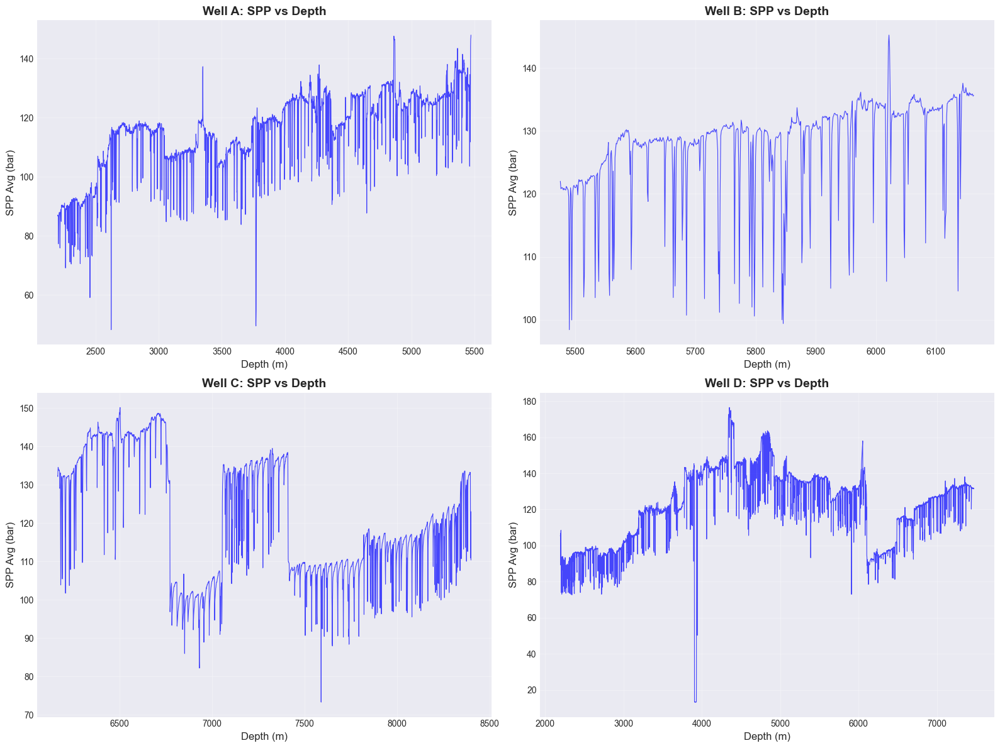

In [6]:
# Plot SPP vs Depth for all wells
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for idx, (well_name, df) in enumerate(wells.items()):
    ax = axes[idx]
    depth_col = 'Depth(m)'
    spp_col = 'SPP Avg(bar)'
    
    ax.plot(df[depth_col], df[spp_col], 'b-', linewidth=0.8, alpha=0.7)
    ax.set_xlabel('Depth (m)', fontsize=12)
    ax.set_ylabel('SPP Avg (bar)', fontsize=12)
    ax.set_title(f'Well {well_name}: SPP vs Depth', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    
plt.tight_layout()
fig.savefig("../figures/01_explore_wells/SPP_vs_depth.pdf")
plt.show()


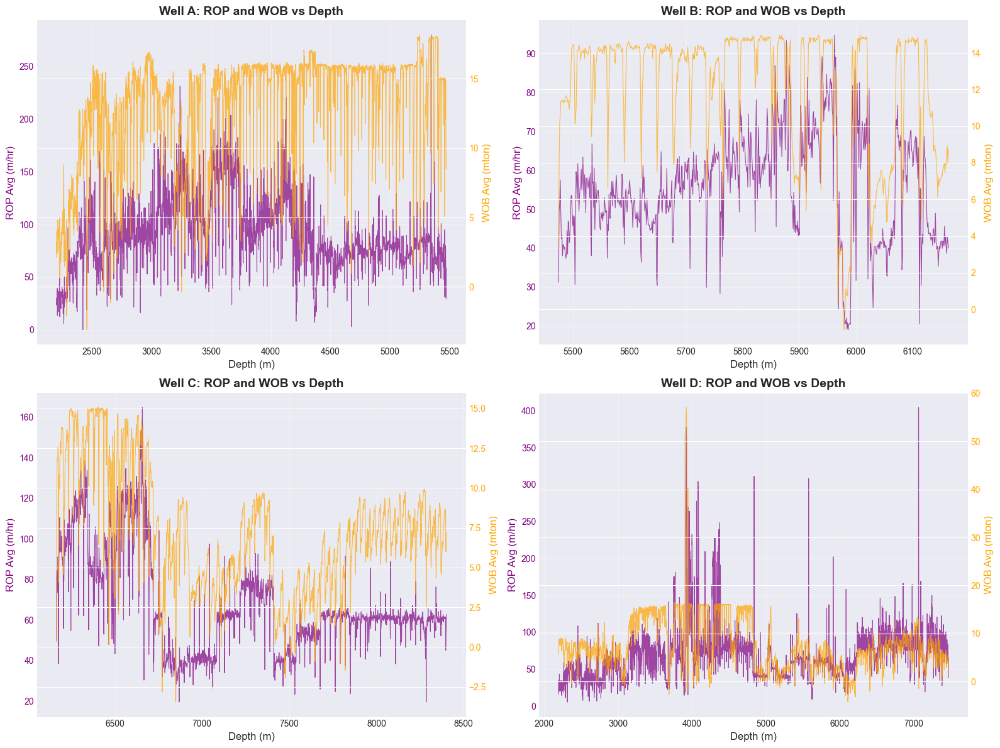

In [7]:
# Plot ROP and WOB vs Depth for all wells (with separate y-axes)
# Remove rows where ROP or WOB are above 500 or below -200


fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for idx, (well_name, df) in enumerate(wells.items()):
    df = df[(df['ROP Avg(m/hr)'].between(-200, 500)) & (df['WOB Avg(mton)'].between(-200, 500))]
    ax = axes[idx]
    depth_col = 'Depth(m)'
    rop_col = 'ROP Avg(m/hr)'
    wob_col = 'WOB Avg(mton)'
    
    ax.plot(df[depth_col], df[rop_col], color='purple', linewidth=0.8, alpha=0.7, label='ROP Avg (m/hr)')
    ax.set_xlabel('Depth (m)', fontsize=12)
    ax.set_ylabel('ROP Avg (m/hr)', color='purple', fontsize=12)
    ax.tick_params(axis='y', labelcolor='purple')
    ax.grid(True, alpha=0.3)
    
    ax2 = ax.twinx()
    ax2.plot(df[depth_col], df[wob_col], color='orange', linewidth=0.8, alpha=0.7, label='WOB Avg (mton)')
    ax2.set_ylabel('WOB Avg (mton)', color='orange', fontsize=12)
    ax2.tick_params(axis='y', labelcolor='orange')
    
    ax.set_title(f'Well {well_name}: ROP and WOB vs Depth', fontsize=14, fontweight='bold')

plt.tight_layout()
fig.savefig("../figures/01_explore_wells/ROP_WOB_vs_depth.pdf")
plt.show()

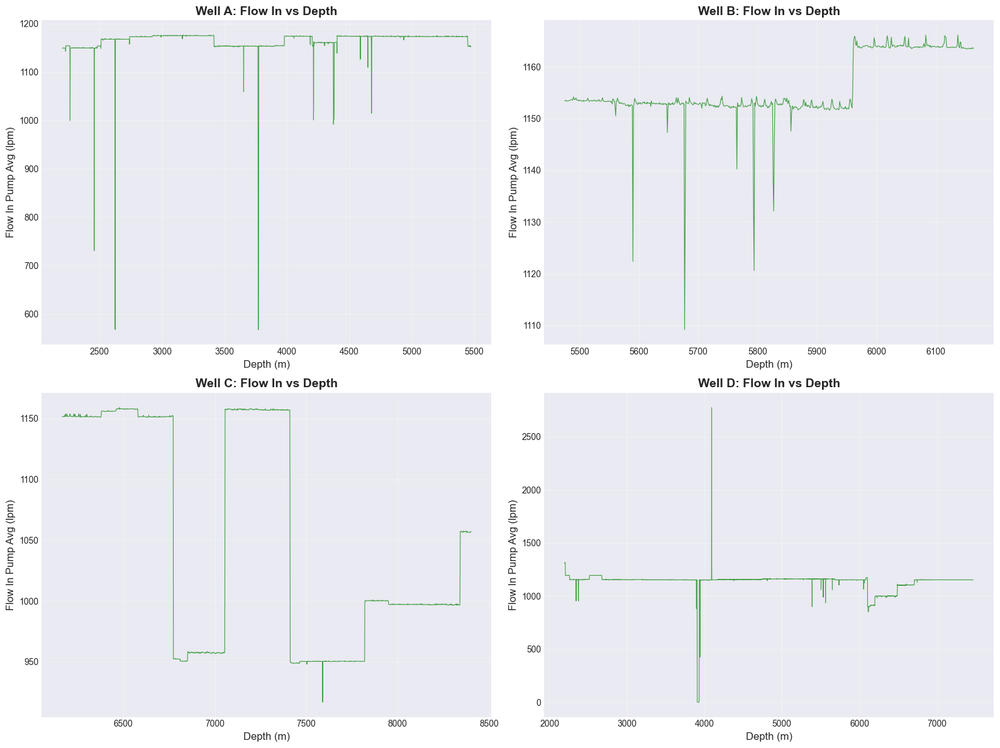

In [8]:
# Plot Flow In vs Depth for all wells
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for idx, (well_name, df) in enumerate(wells.items()):
    ax = axes[idx]
    depth_col = 'Depth(m)'
    flow_col = 'Flow In Pum Avg(lpm)'
    
    ax.plot(df[depth_col], df[flow_col], 'g-', linewidth=0.8, alpha=0.7)
    ax.set_xlabel('Depth (m)', fontsize=12)
    ax.set_ylabel('Flow In Pump Avg (lpm)', fontsize=12)
    ax.set_title(f'Well {well_name}: Flow In vs Depth', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    
plt.tight_layout()
fig.savefig("../figures/01_explore_wells/flow_in_vs_depth.pdf")
plt.show()


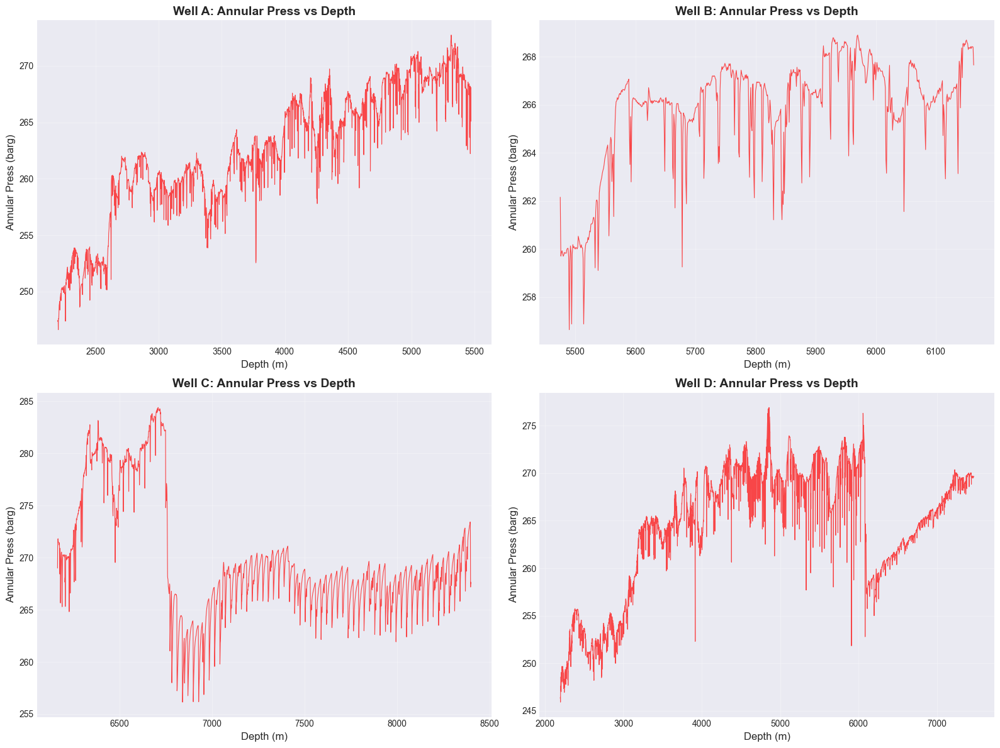

In [9]:
# Plot Annular Press vs Depth for all wells
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for idx, (well_name, df) in enumerate(wells.items()):
    ax = axes[idx]
    depth_col = 'Depth(m)'
    ann_press_col = 'Annular Press(barg)'
    
    # Check if column exists and has data
    if ann_press_col in df.columns and df[ann_press_col].notna().any():
        ax.plot(df[depth_col], df[ann_press_col], 'r-', linewidth=0.8, alpha=0.7)
        ax.set_xlabel('Depth (m)', fontsize=12)
        ax.set_ylabel('Annular Press (barg)', fontsize=12)
        ax.set_title(f'Well {well_name}: Annular Press vs Depth', fontsize=14, fontweight='bold')
    else:
        ax.text(0.5, 0.5, 'No data available', ha='center', va='center', transform=ax.transAxes)
        ax.set_title(f'Well {well_name}: Annular Press vs Depth (No Data)', fontsize=14, fontweight='bold')
    
    ax.grid(True, alpha=0.3)
    
plt.tight_layout()
fig.savefig("../figures/01_explore_wells/P_ann_vs_depth.pdf")
plt.show()


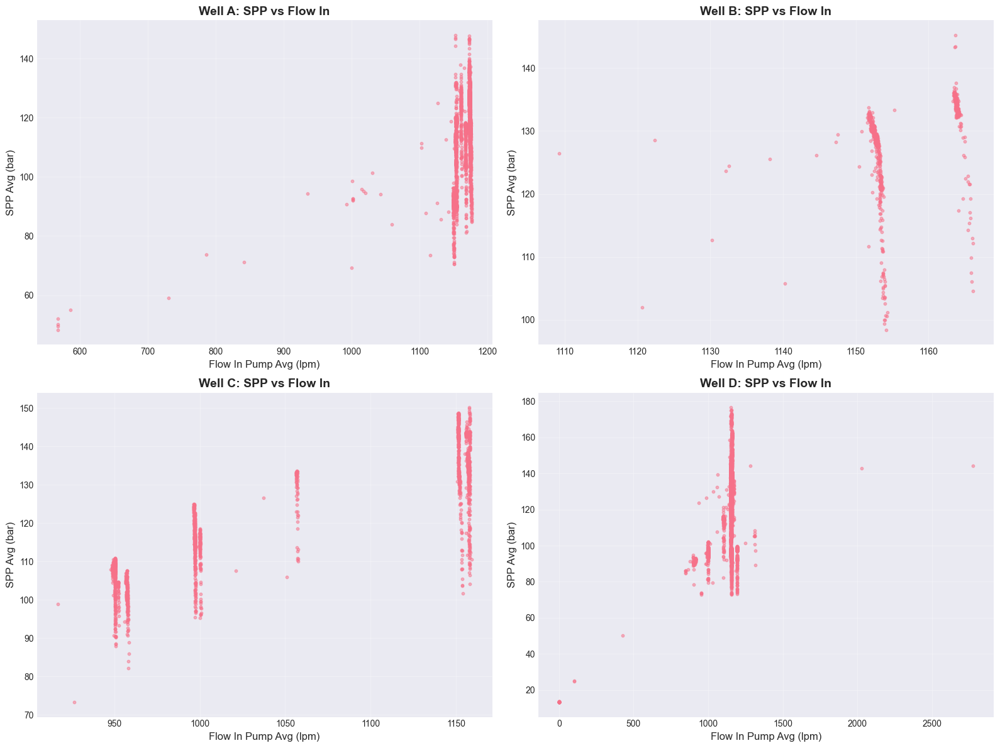

In [10]:
# Plot SPP vs Flow In (scatter) for all wells
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for idx, (well_name, df) in enumerate(wells.items()):
    ax = axes[idx]
    spp_col = 'SPP Avg(bar)'
    flow_col = 'Flow In Pum Avg(lpm)'
    
    ax.scatter(df[flow_col], df[spp_col], alpha=0.5, s=10)
    ax.set_xlabel('Flow In Pump Avg (lpm)', fontsize=12)
    ax.set_ylabel('SPP Avg (bar)', fontsize=12)
    ax.set_title(f'Well {well_name}: SPP vs Flow In', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    
plt.tight_layout()
fig.savefig("../figures/01_explore_wells/spp_flow_in_scatter.pdf")
plt.show()


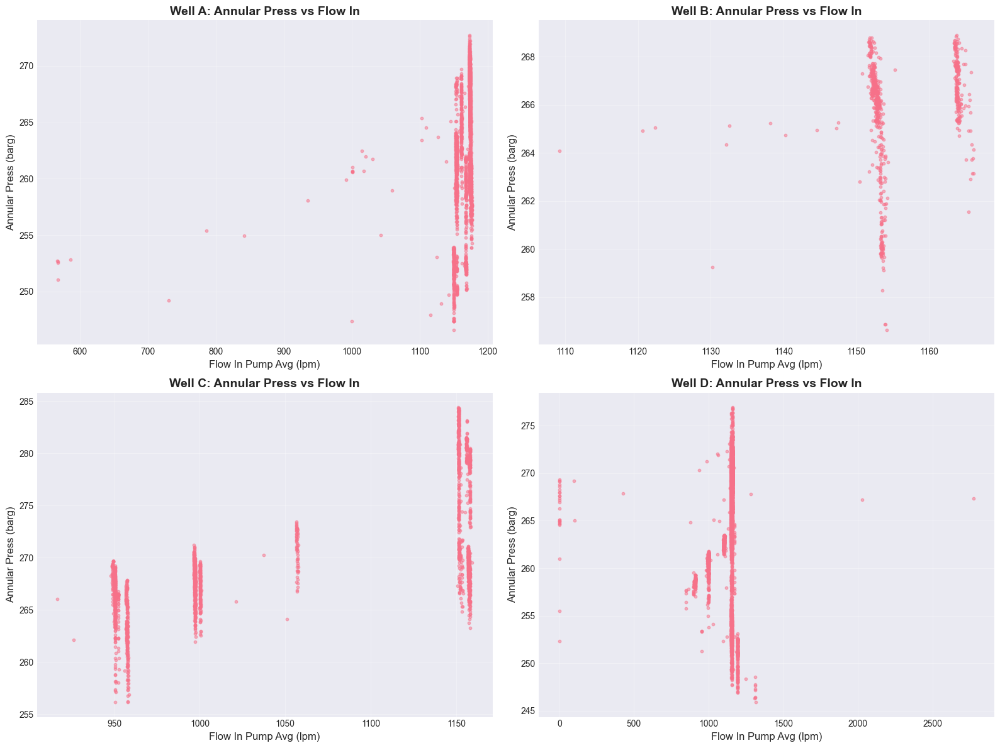

In [11]:
# Plot Annular Press vs Flow In (scatter) for all wells
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for idx, (well_name, df) in enumerate(wells.items()):
    ax = axes[idx]
    ann_press_col = 'Annular Press(barg)'
    flow_col = 'Flow In Pum Avg(lpm)'
    
    ax.scatter(df[flow_col], df[ann_press_col], alpha=0.5, s=10)
    ax.set_xlabel('Flow In Pump Avg (lpm)', fontsize=12)
    ax.set_ylabel('Annular Press (barg)', fontsize=12)
    ax.set_title(f'Well {well_name}: Annular Press vs Flow In', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    
plt.tight_layout()
fig.savefig("../figures/01_explore_wells/ann_press_flow_in_scatter.pdf")
plt.show()


Saved: ../figures/01_explore_wells/figure_4.1_depth_range_tvd_profile.pdf


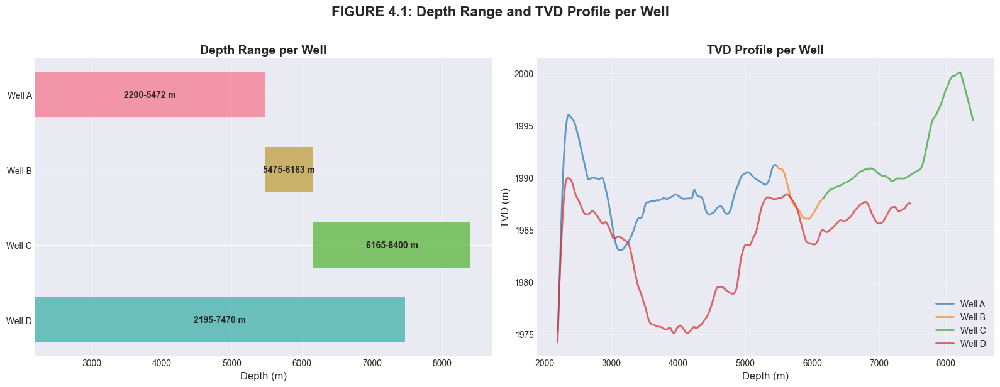


DEPTH STATISTICS SUMMARY
Well A: Depth 2200-5472 m, TVD 1975.3-1996.0 m, N=3273 samples
Well B: Depth 5475-6163 m, TVD 1986.0-1991.1 m, N=689 samples
Well C: Depth 6165-8400 m, TVD 1988.0-2000.1 m, N=2236 samples
Well D: Depth 2195-7470 m, TVD 1974.2-1990.0 m, N=5271 samples


In [31]:
# ============================================================================
# FIGURE 4.1: Depth Range and TVD Profile per Well
# ============================================================================
# Summary of depth statistics per well showing:
# - Depth range (min-max) for each well
# - TVD profile (TVD vs Depth) for each well

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# ========================================================================
# Panel 1: Depth Range per Well
# ========================================================================
ax1 = axes[0]

well_names = []
depth_mins = []
depth_maxs = []
depth_ranges = []

for well_id in ['A', 'B', 'C', 'D']:
    if well_id in wells.keys():
        well_data = wells[well_id]
        depth_col = 'Depth(m)'
        
        if depth_col in well_data.columns:
            depth_valid = well_data[depth_col].dropna()
            if len(depth_valid) > 0:
                depth_min = depth_valid.min()
                depth_max = depth_valid.max()
                
                well_names.append(f'Well {well_id}')
                depth_mins.append(depth_min)
                depth_maxs.append(depth_max)
                depth_ranges.append((depth_min, depth_max))

# Create bar plot showing depth range
x_pos = np.arange(len(well_names))
width = 0.6

# Plot bars from min to max
for i, (well_name, d_min, d_max) in enumerate(zip(well_names, depth_mins, depth_maxs)):
    ax1.barh(i, d_max - d_min, left=d_min, height=width, alpha=0.7, 
             label=well_name if i == 0 else '')
    # Add text labels
    ax1.text(d_min + (d_max - d_min) / 2, i, f'{d_min:.0f}-{d_max:.0f} m', 
             ha='center', va='center', fontweight='bold', fontsize=10)

ax1.set_yticks(x_pos)
ax1.set_yticklabels(well_names)
ax1.set_xlabel('Depth (m)', fontsize=12)
ax1.set_title('Depth Range per Well', fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3, axis='x')
ax1.invert_yaxis()  # Invert so Well A is at top

# ========================================================================
# Panel 2: TVD Profile per Well
# ========================================================================
ax2 = axes[1]

colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
for idx, well_id in enumerate(['A', 'B', 'C', 'D']):
    if well_id in wells.keys():
        well_data = wells[well_id]
        depth_col = 'Depth(m)'
        tvd_col = 'TVD(m)'
        
        if depth_col in well_data.columns and tvd_col in well_data.columns:
            # Filter valid data and remove negative TVD values
            mask = (well_data[depth_col].notna() & 
                   well_data[tvd_col].notna() & 
                   (well_data[tvd_col] >= 0))
            if mask.sum() > 0:
                # Get data and sort by depth to keep depth-TVD pairs aligned
                data_subset = well_data.loc[mask, [depth_col, tvd_col]].sort_values(by=depth_col)
                depth_data = data_subset[depth_col]
                tvd_data = data_subset[tvd_col]
                
                # Plot TVD vs Depth
                ax2.plot(depth_data, tvd_data, 
                        color=colors[idx], linewidth=2, alpha=0.7, 
                        label=f'Well {well_id}')

ax2.set_xlabel('Depth (m)', fontsize=12)
ax2.set_ylabel('TVD (m)', fontsize=12)
ax2.set_title('TVD Profile per Well', fontsize=14, fontweight='bold')
ax2.legend(loc='best', fontsize=10)
ax2.grid(True, alpha=0.3)

fig.suptitle('FIGURE 4.1: Depth Range and TVD Profile per Well', 
             fontsize=16, fontweight='bold', y=1.02)
fig.tight_layout()

# Save to PDF
import os
output_dir = "../figures/01_explore_wells/"
os.makedirs(output_dir, exist_ok=True)
fig.savefig(f"{output_dir}figure_4.1_depth_range_tvd_profile.pdf", bbox_inches='tight')
print(f"Saved: {output_dir}figure_4.1_depth_range_tvd_profile.pdf")

plt.show()

# Print summary statistics
print("\n" + "="*80)
print("DEPTH STATISTICS SUMMARY")
print("="*80)
for well_id in ['A', 'B', 'C', 'D']:
    if well_id in wells.keys():
        well_data = wells[well_id]
        depth_col = 'Depth(m)'
        tvd_col = 'TVD(m)'
        
        if depth_col in well_data.columns:
            depth_valid = well_data[depth_col].dropna()
            if len(depth_valid) > 0:
                depth_min = depth_valid.min()
                depth_max = depth_valid.max()
                
                if tvd_col in well_data.columns:
                    # Filter out negative TVD values
                    tvd_valid = well_data[(well_data[tvd_col].notna()) & (well_data[tvd_col] >= 0)][tvd_col]
                    if len(tvd_valid) > 0:
                        tvd_min = tvd_valid.min()
                        tvd_max = tvd_valid.max()
                        print(f"Well {well_id}: Depth {depth_min:.0f}-{depth_max:.0f} m, "
                              f"TVD {tvd_min:.1f}-{tvd_max:.1f} m, "
                              f"N={len(depth_valid)} samples")
                    else:
                        print(f"Well {well_id}: Depth {depth_min:.0f}-{depth_max:.0f} m, "
                              f"N={len(depth_valid)} samples")
                else:
                    print(f"Well {well_id}: Depth {depth_min:.0f}-{depth_max:.0f} m, "
                          f"N={len(depth_valid)} samples")
print("="*80)

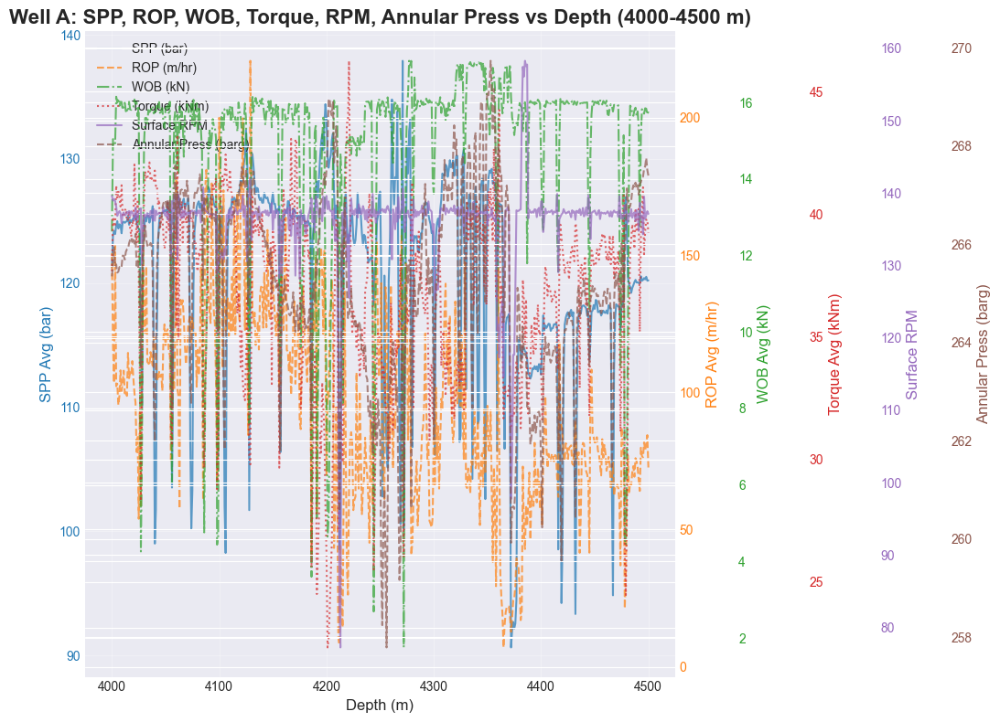

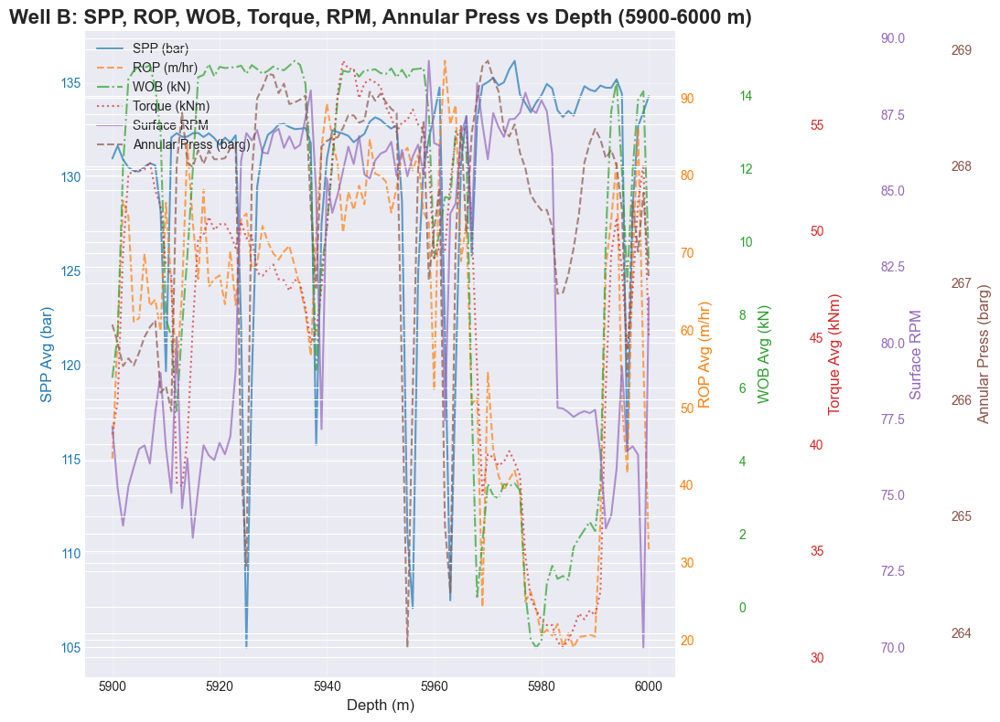

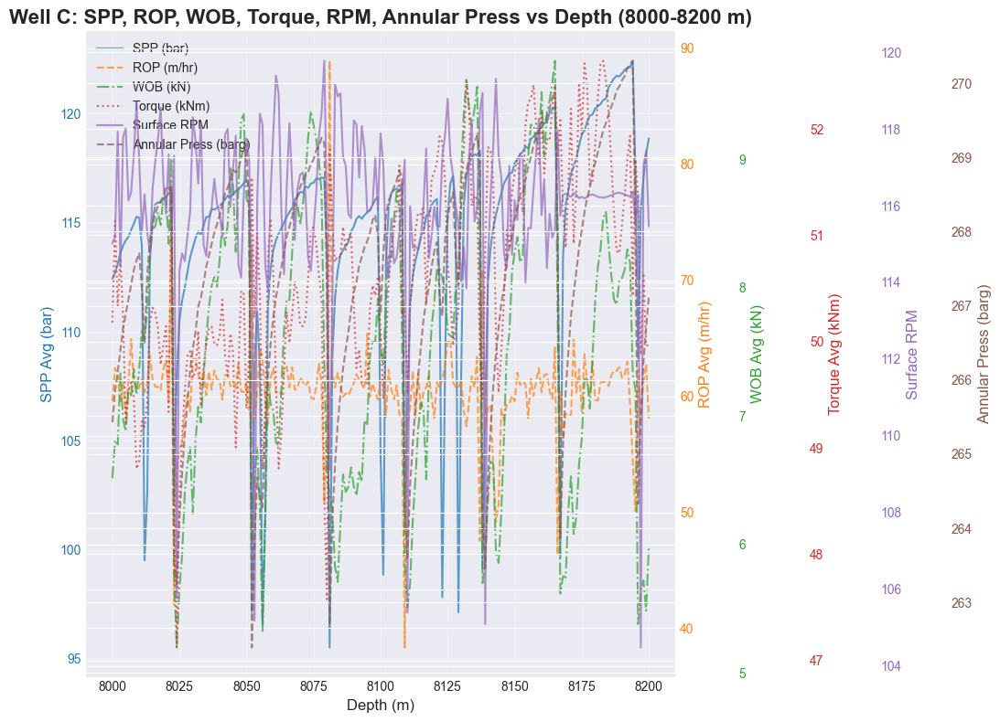

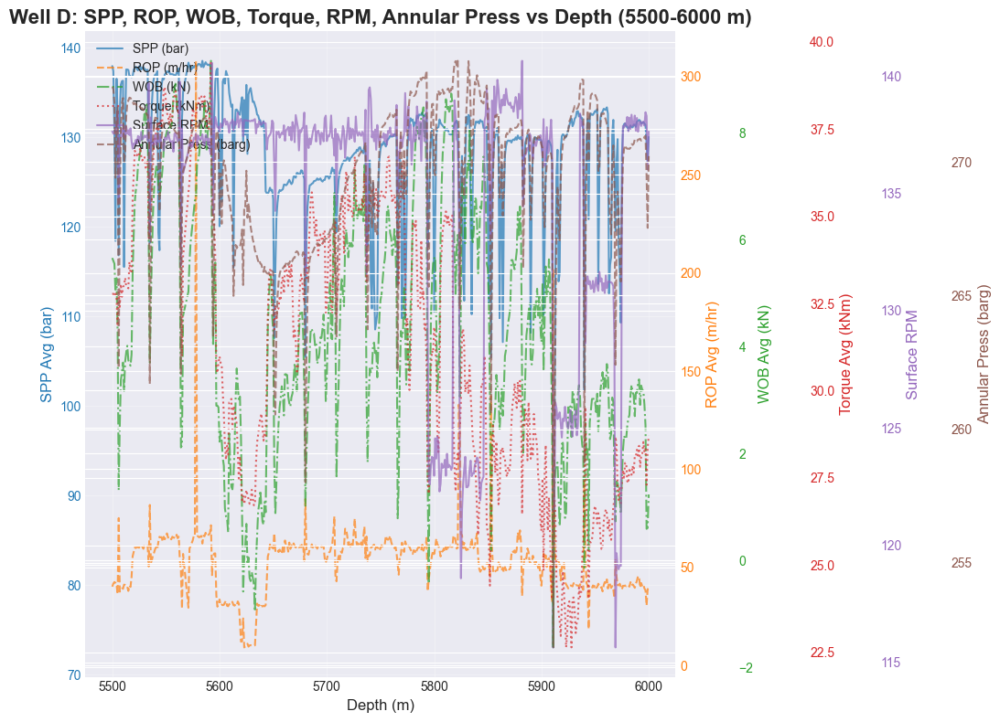

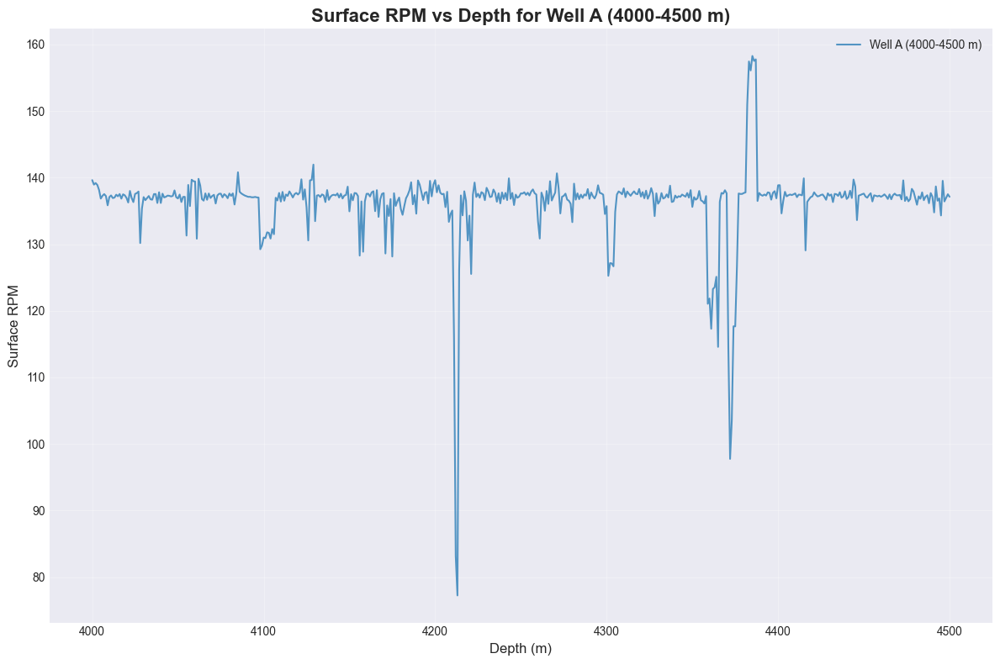

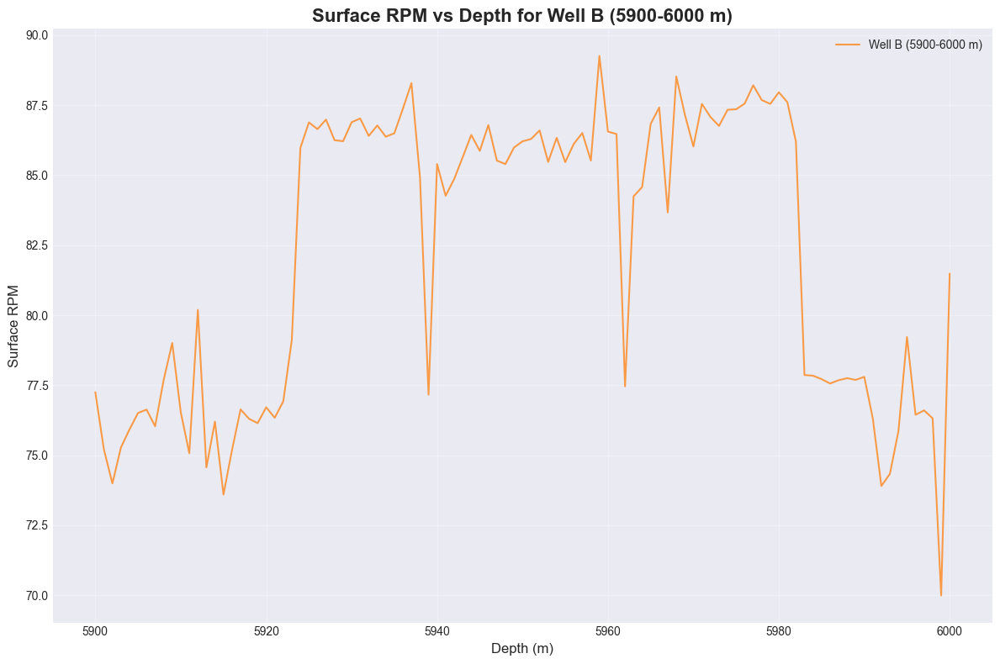

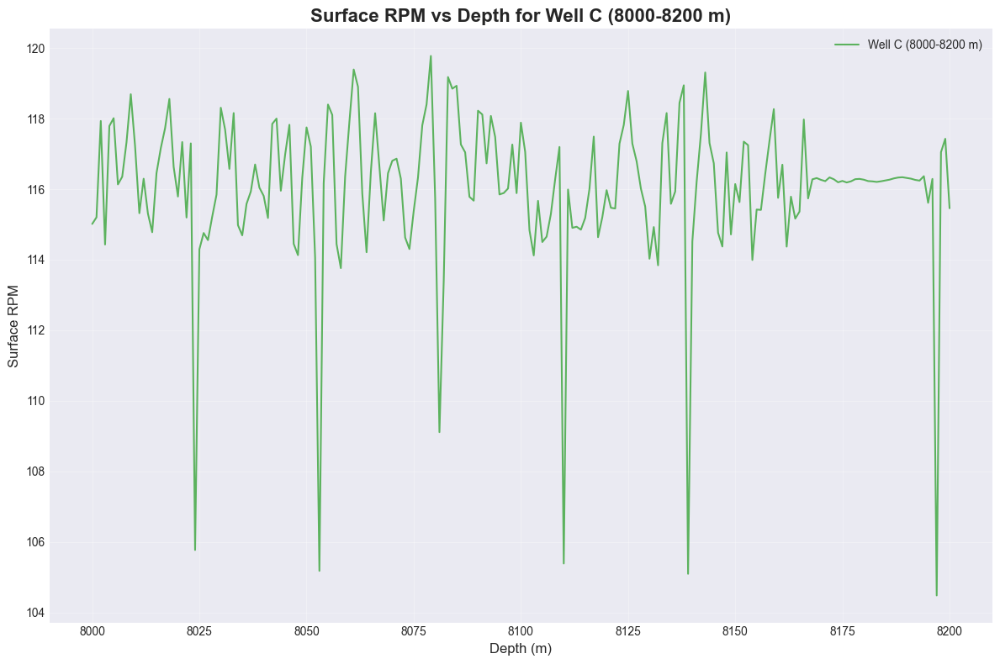

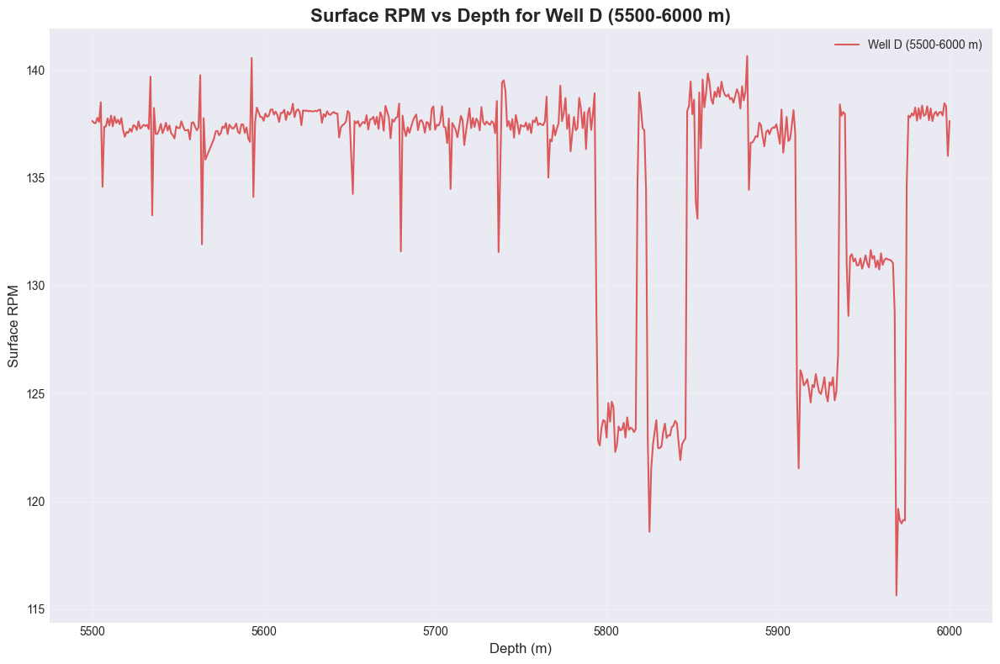

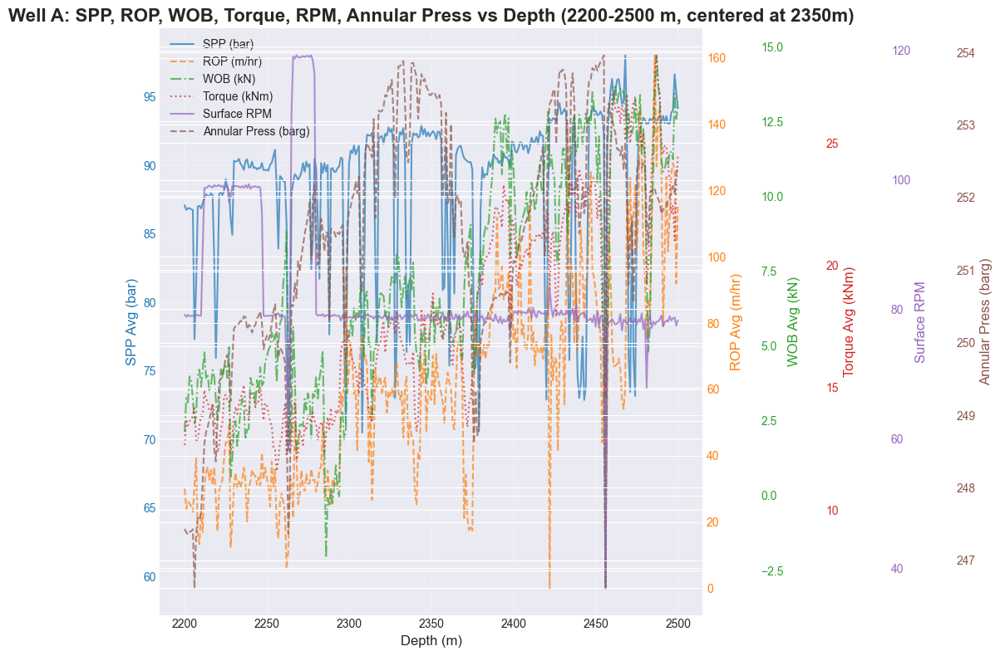

Saved plot for depth 2650 (2500-2800 m) to ../figures/interesting_intervals/A/2500-2800.pdf


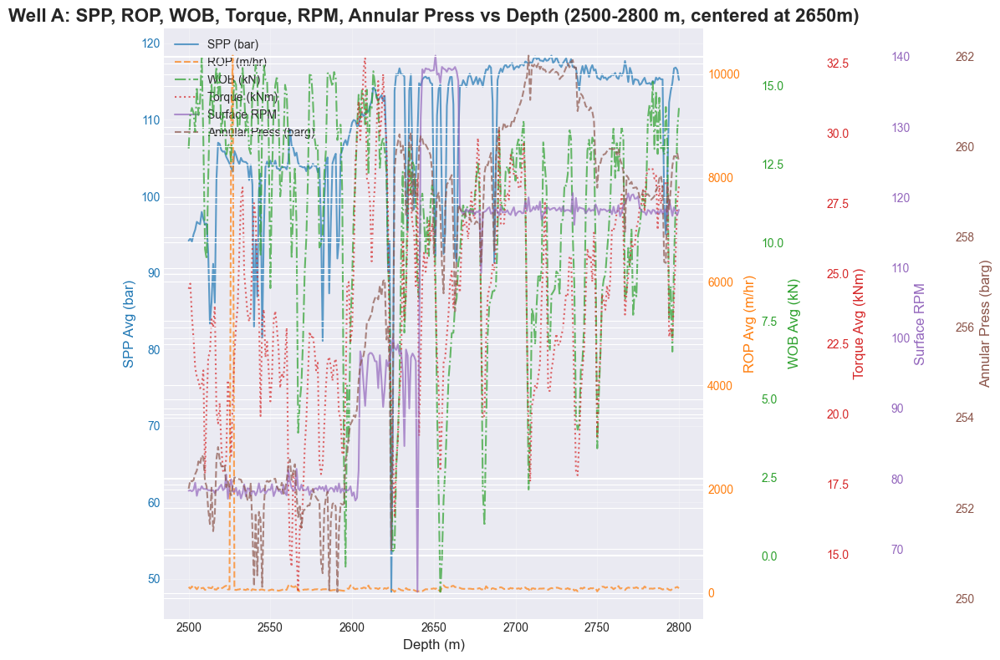

Saved plot for depth 2950 (2800-3100 m) to ../figures/interesting_intervals/A/2800-3100.pdf


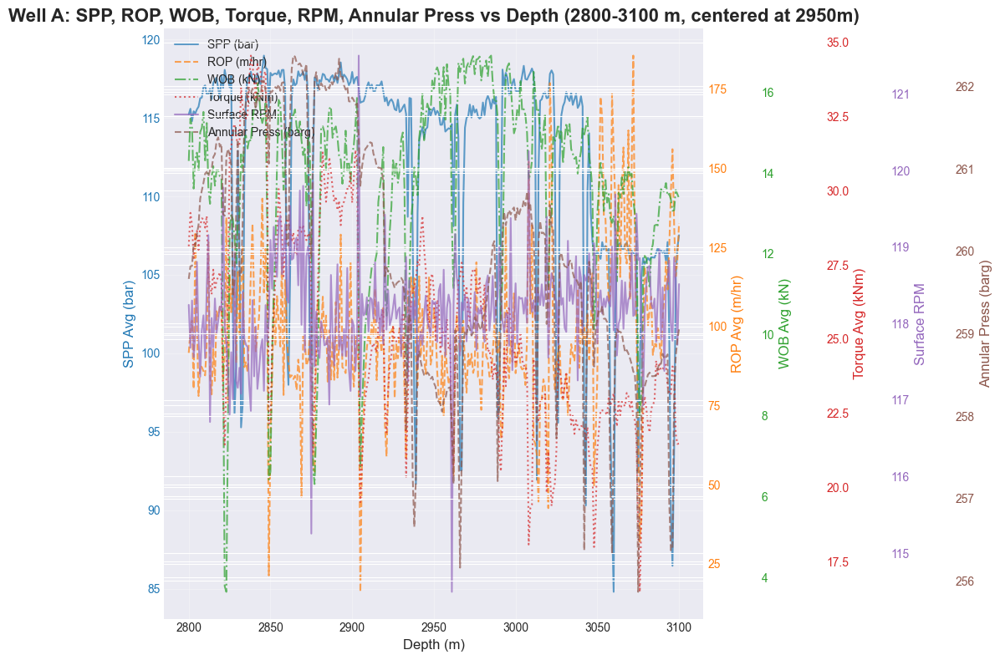

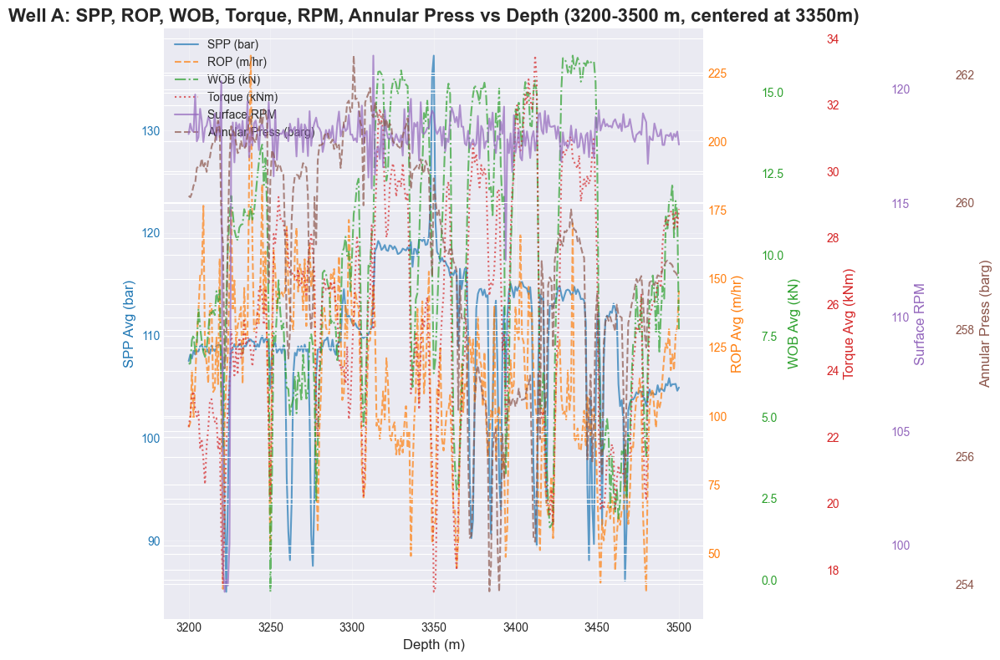

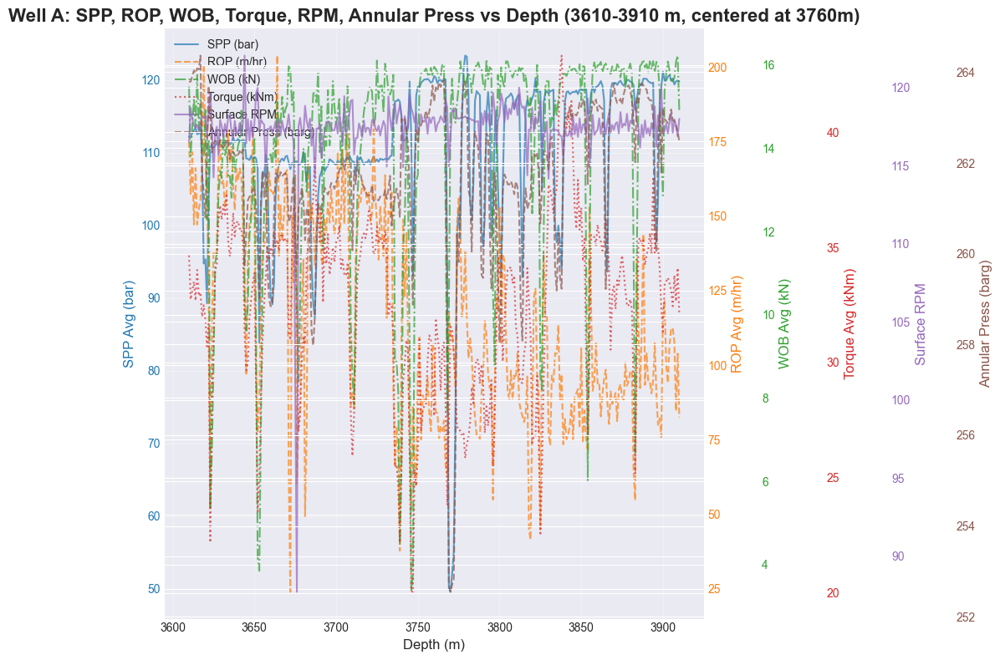

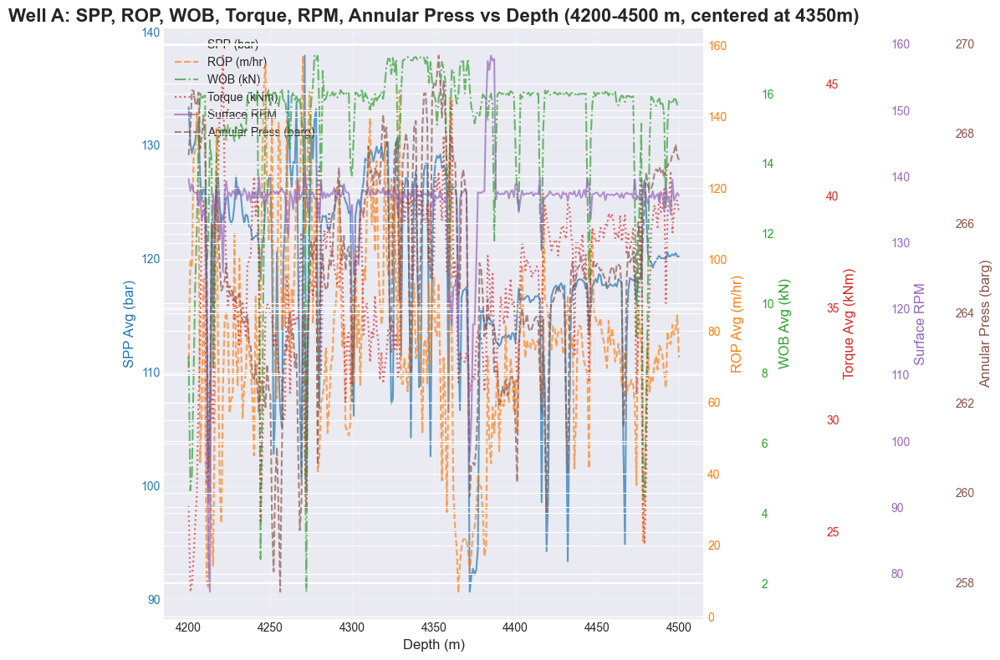

Saved plot for depth 4870 (4720-5020 m) to ../figures/interesting_intervals/A/4700-5000.pdf


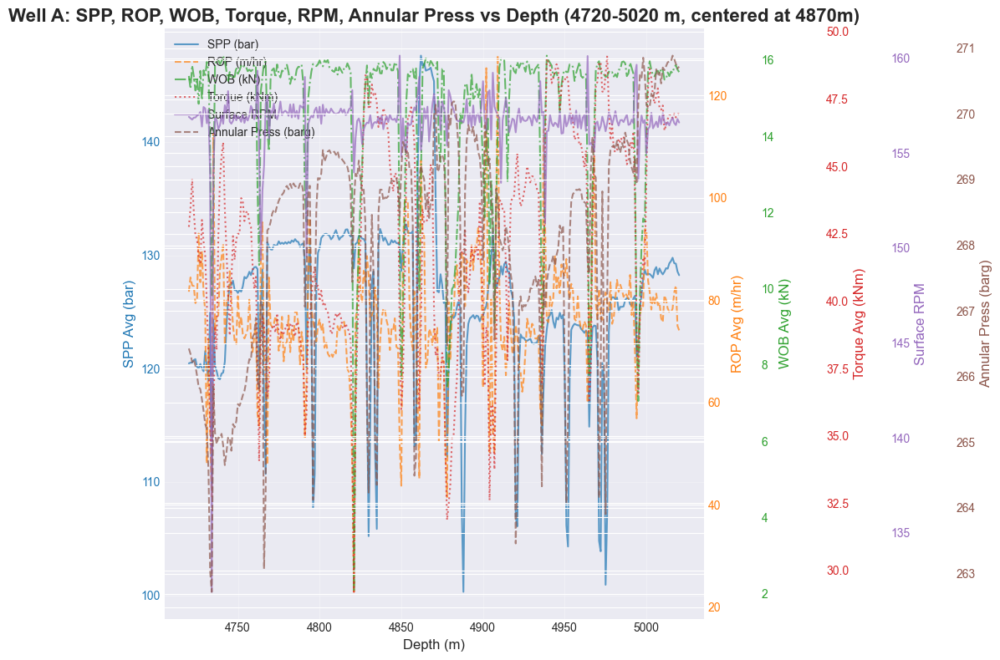

Saved plot for depth 5430 (5280-5580 m) to ../figures/interesting_intervals/A/5275-5475.pdf


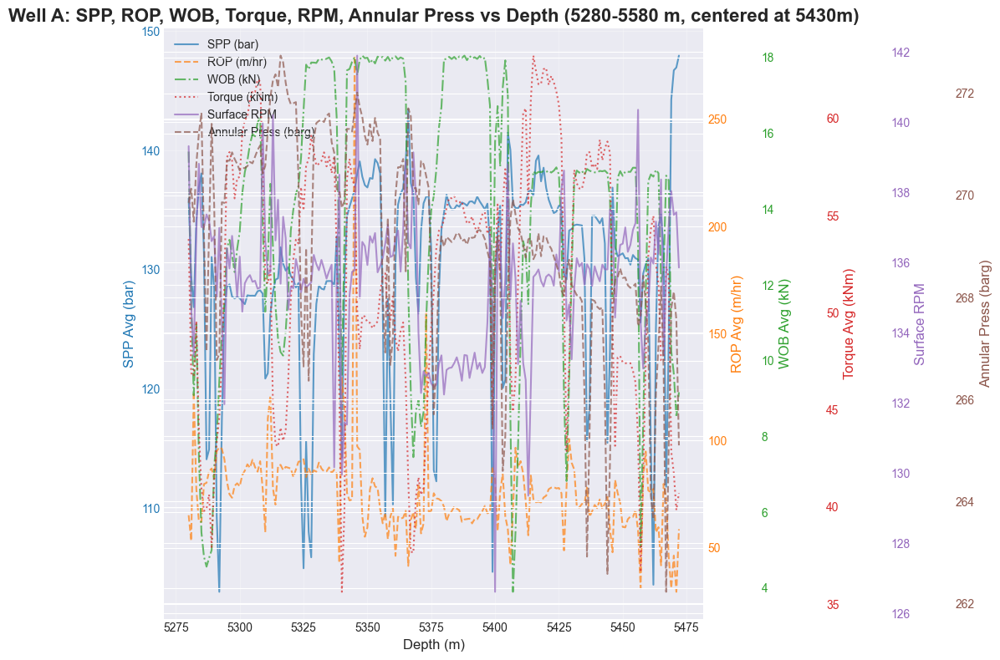

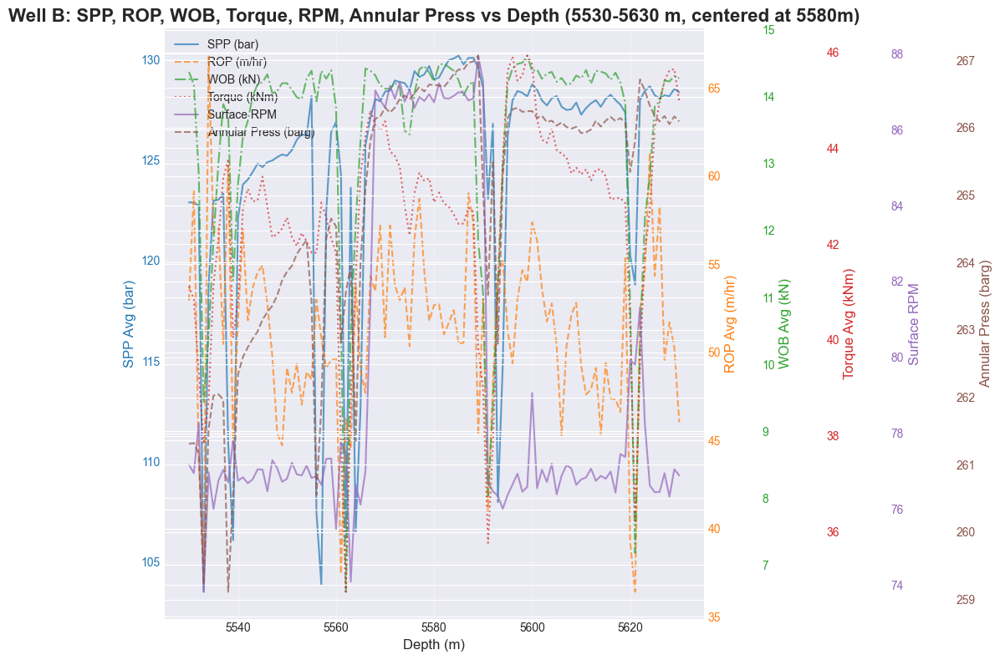

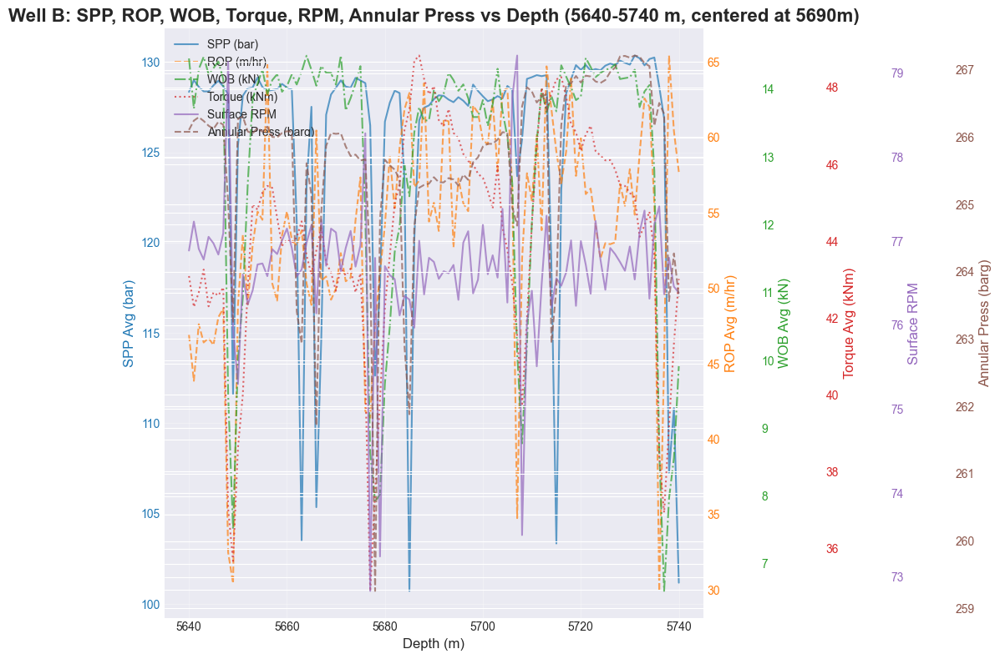

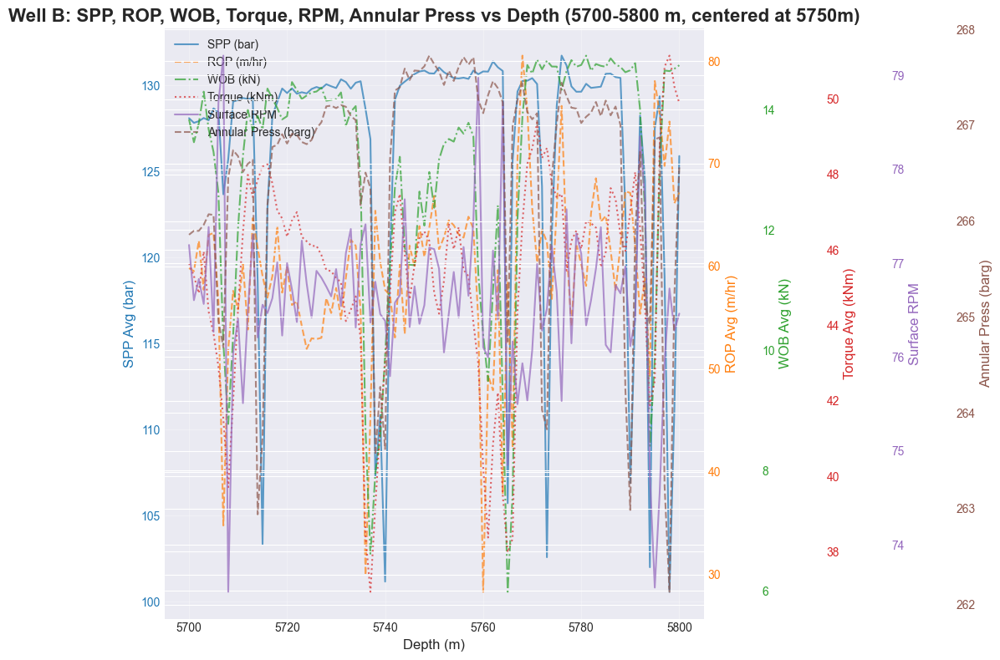

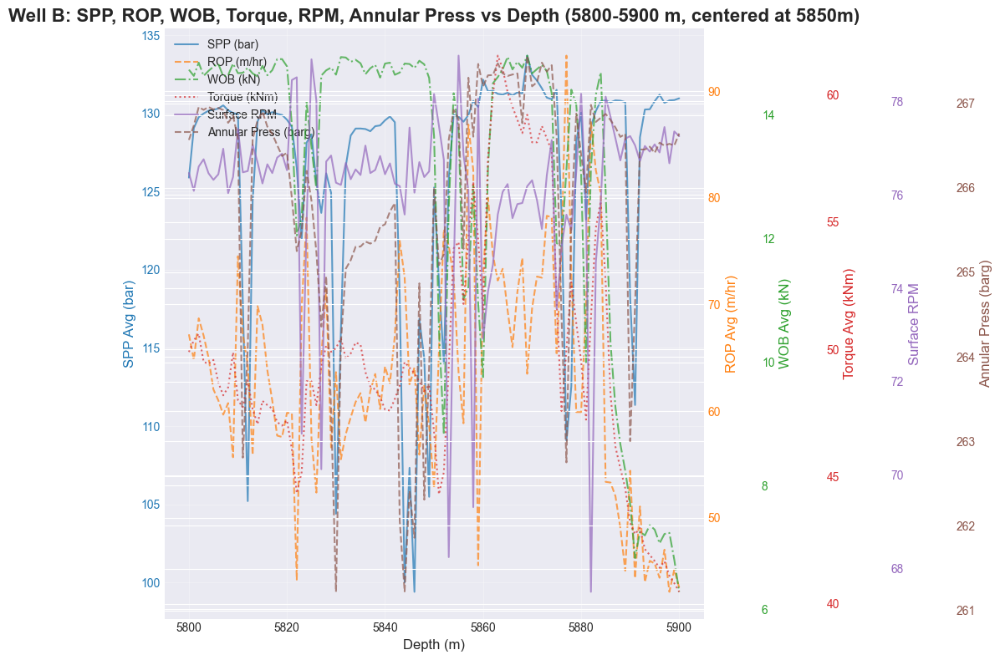

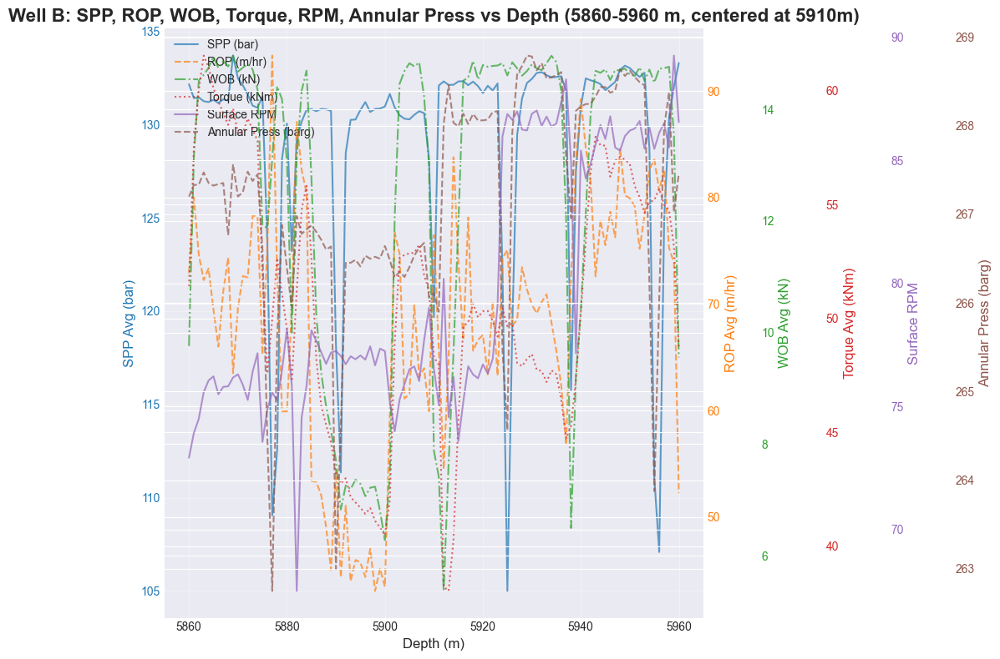

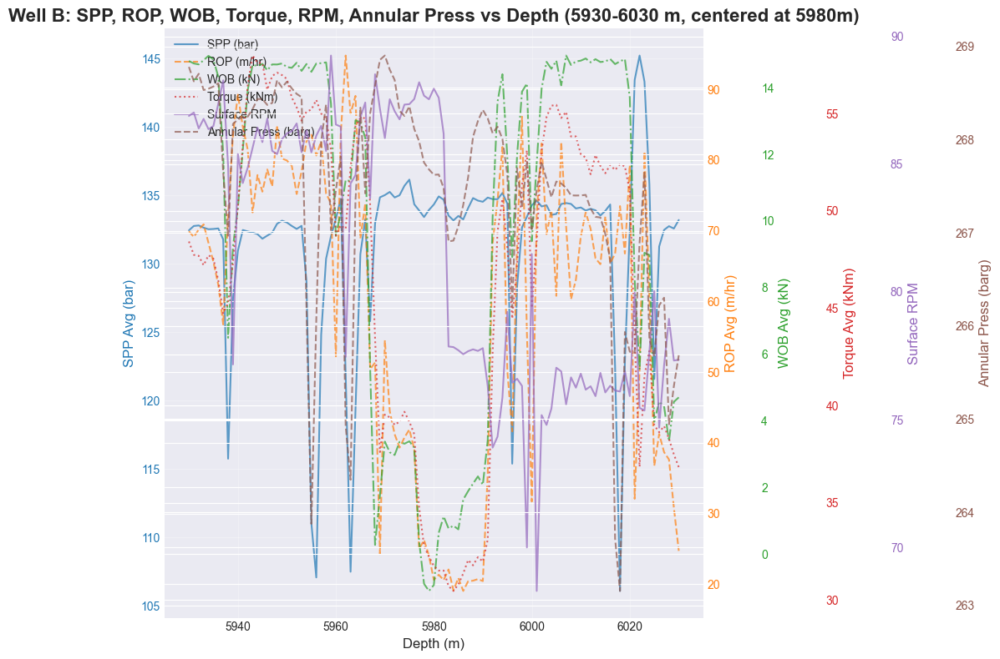

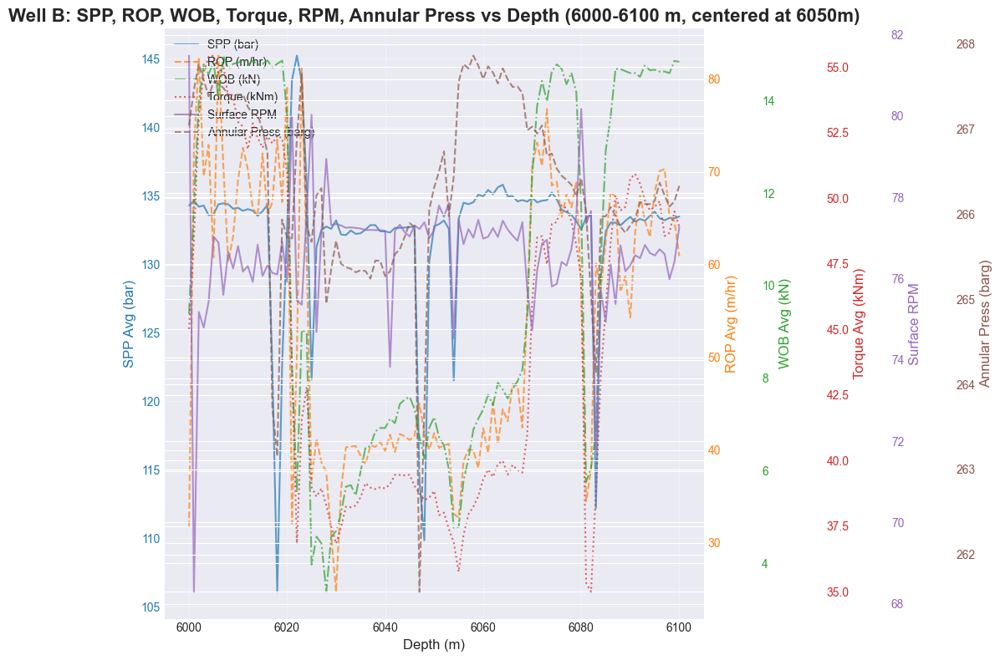

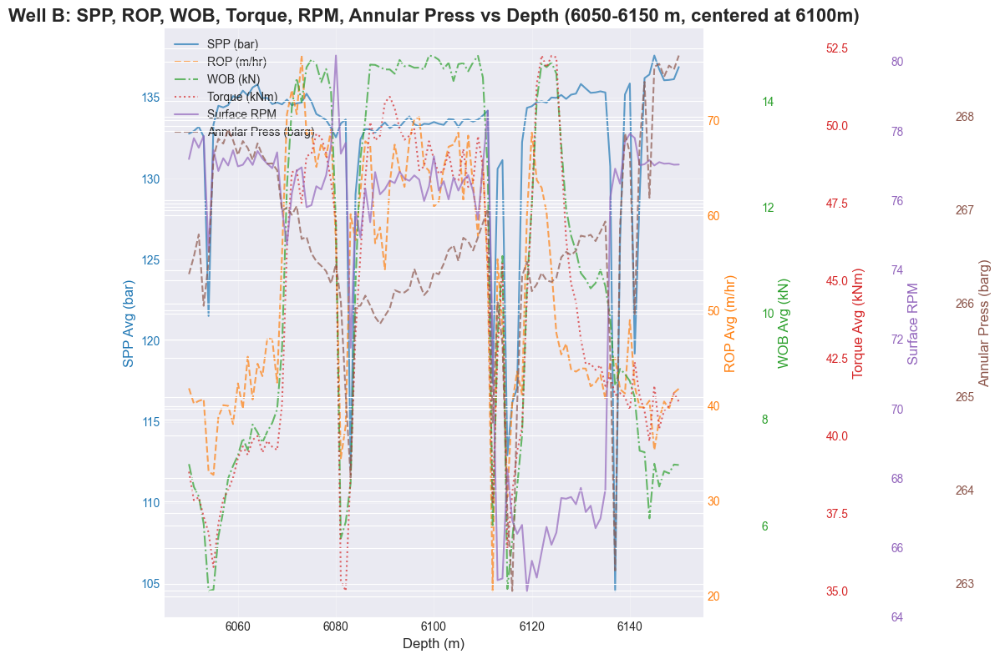

Saved plot for depth 5430 (7100-7400 m) to ../figures/interesting_intervals/C/7100-7400.pdf


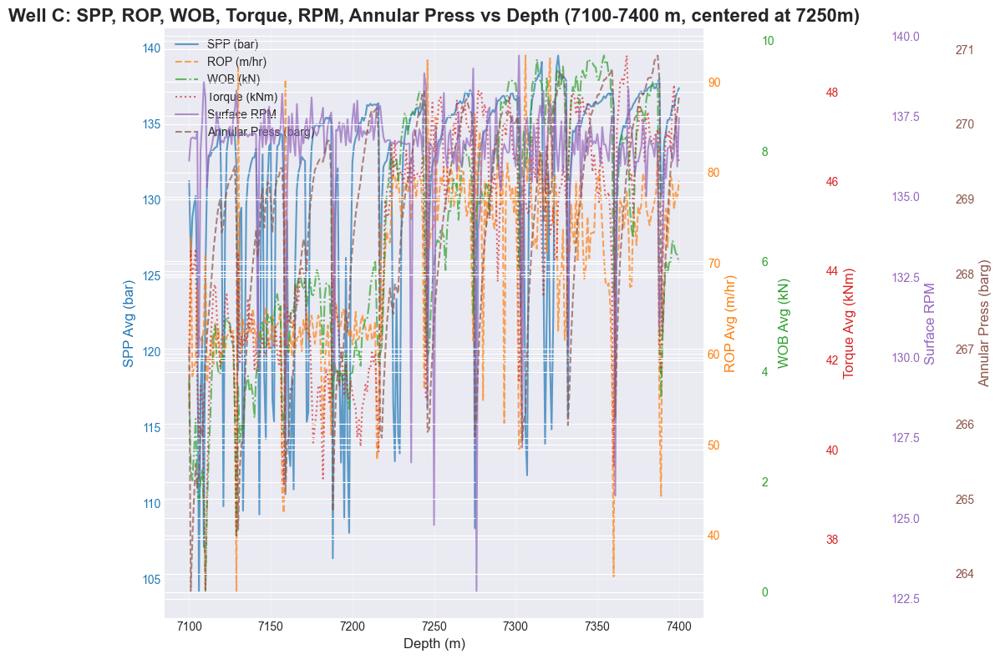

Saved plot for depth 5430 (7950-8250 m) to ../figures/interesting_intervals/C/7950-8250.pdf


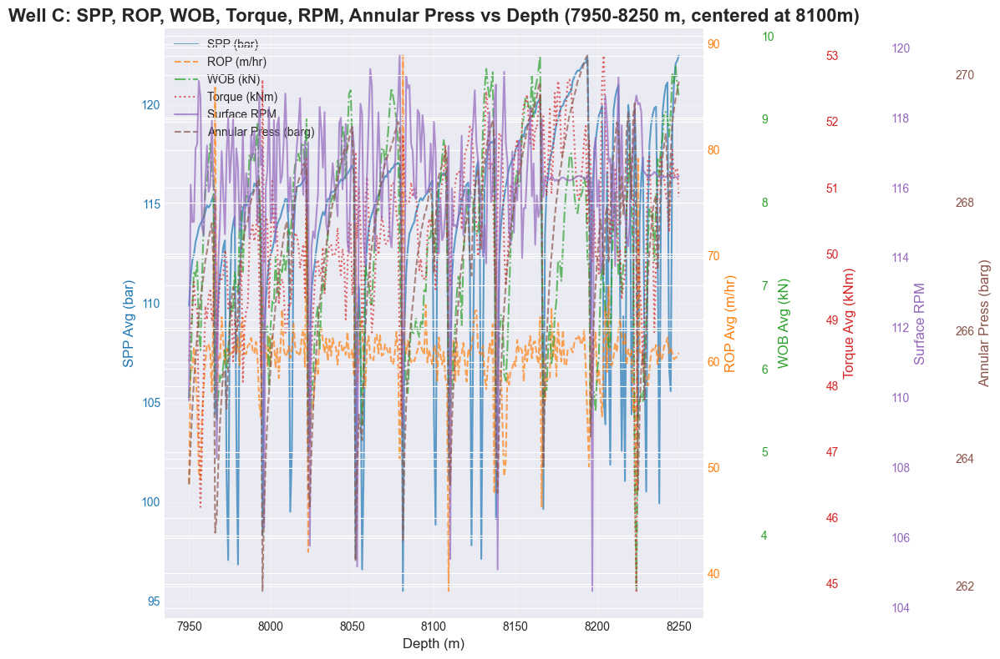

In [29]:
# Plot SPP, ROP, WOB, Torque, and Surface RPM vs Depth for wells A, B, C, D, each in its own figure, for specified depth ranges
# Also plot separate figures with only Surface RPM vs Depth for each well/interval

depth_col = 'Depth(m)'
spp_col = 'SPP Avg(bar)'
rop_col = 'ROP Avg(m/hr)'
wob_col = 'WOB Avg(mton)'
torque_col = 'Torque Abs Avg(kN-m)'
rpm_col = 'RPM Surface Avg(rpm)'
ann_press_col = 'Annular Press(barg)'

well_selections = [
    ('A', 4000, 4500),
    ('B', 5900, 6000),
    ('C', 8000, 8200),
    ('D', 5500, 6000),
]

# First, individual figures per well for all variables
for well_key, dmin, dmax in well_selections:
    well = wells[well_key]
    mask = (well[depth_col] >= dmin) & (well[depth_col] <= dmax)
    well_filtered = well[mask]

    fig, ax1 = plt.subplots(figsize=(12, 8))
    ax1.plot(well_filtered[depth_col], well_filtered[spp_col], label='SPP (bar)', color='tab:blue', linestyle='-', alpha=0.7)
    ax1.set_xlabel('Depth (m)', fontsize=12)
    ax1.set_ylabel('SPP Avg (bar)', fontsize=12, color='tab:blue')
    ax1.tick_params(axis='y', labelcolor='tab:blue')
    
    # ROP on 2nd y-axis
    ax2 = ax1.twinx()
    ax2.plot(well_filtered[depth_col], well_filtered[rop_col], label='ROP (m/hr)', color='tab:orange', linestyle='--', alpha=0.7)
    ax2.set_ylabel('ROP Avg (m/hr)', fontsize=12, color='tab:orange')
    ax2.tick_params(axis='y', labelcolor='tab:orange')

    # Add WOB against 3rd y-axis
    ax3 = ax1.twinx()
    ax3.spines["right"].set_position(("axes", 1.1))
    ax3.plot(well_filtered[depth_col], well_filtered[wob_col], label='WOB (kN)', color='tab:green', linestyle='-.', alpha=0.7)
    ax3.set_ylabel('WOB Avg (kN)', fontsize=12, color='tab:green')
    ax3.tick_params(axis='y', labelcolor='tab:green')

    # Add Torque against 4th y-axis
    ax4 = ax1.twinx()
    ax4.spines["right"].set_position(("axes", 1.22))
    ax4.plot(well_filtered[depth_col], well_filtered[torque_col], label='Torque (kNm)', color='tab:red', linestyle=':', alpha=0.7)
    ax4.set_ylabel('Torque Avg (kNm)', fontsize=12, color='tab:red')
    ax4.tick_params(axis='y', labelcolor='tab:red')

    # Add Surface RPM against 5th y-axis
    ax5 = ax1.twinx()
    ax5.spines["right"].set_position(("axes", 1.34))
    ax5.plot(well_filtered[depth_col], well_filtered[rpm_col], label='Surface RPM', color='tab:purple', linestyle='-', alpha=0.7)
    ax5.set_ylabel('Surface RPM', fontsize=12, color='tab:purple')
    ax5.tick_params(axis='y', labelcolor='tab:purple')

    # Add Annular Pressure against 6th y-axis
    ax6 = ax1.twinx()
    ax6.spines["right"].set_position(("axes", 1.46))
    ax6.plot(well_filtered[depth_col], well_filtered[ann_press_col], label='Annular Press (barg)', color='tab:brown', linestyle='--', alpha=0.7)
    ax6.set_ylabel('Annular Press (barg)', fontsize=12, color='tab:brown')
    ax6.tick_params(axis='y', labelcolor='tab:brown')

    # Add title, grid, and legend (combine all)
    ax1.set_title(f'Well {well_key}: SPP, ROP, WOB, Torque, RPM, Annular Press vs Depth ({dmin}-{dmax} m)', fontsize=16, fontweight='bold')
    ax1.grid(True, alpha=0.3)

    # Legends from all lines
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    lines3, labels3 = ax3.get_legend_handles_labels()
    lines4, labels4 = ax4.get_legend_handles_labels()
    lines5, labels5 = ax5.get_legend_handles_labels()
    lines6, labels6 = ax6.get_legend_handles_labels()

    lines = lines1 + lines2 + lines3 + lines4 + lines5 + lines6
    labels = labels1 + labels2 + labels3 + labels4 + labels5 + labels6
    ax1.legend(lines, labels, loc='upper left', fontsize=10)

    fig.tight_layout()
    #fig.savefig(f"../figures/01_explore_wells/{well_key}_spp_rop_wob_torque_rpm_vs_depth.pdf")
    plt.show()

# Now, create separate RPM vs. Depth plots per well/interval
for (well_key, dmin, dmax), clr in zip(well_selections, ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']):
    well = wells[well_key]
    mask = (well[depth_col] >= dmin) & (well[depth_col] <= dmax)
    well_filtered = well[mask]
    
    plt.figure(figsize=(12, 8))
    plt.plot(well_filtered[depth_col], well_filtered[rpm_col], color=clr, alpha=0.75, label=f'Well {well_key} ({dmin}-{dmax} m)')
    plt.xlabel('Depth (m)', fontsize=12)
    plt.ylabel('Surface RPM', fontsize=12)
    plt.title(f'Surface RPM vs Depth for Well {well_key} ({dmin}-{dmax} m)', fontsize=16, fontweight='bold')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    #plt.savefig(f"../figures/01_explore_wells/surface_rpm_vs_depth_{well_key}_{dmin}_{dmax}.pdf")
    plt.show()

# Plot Well A at specific depth points with custom windows
well_A = [
    (2350, 150, "z_common 2200–2400 (entry/exit); zAP_predSPP 2200–2400 (entry/exit); z_SPPglobal 2350"),
    (2650, 150, "z_diff 2500–2600 (entry/exit); z_common entry 2600; zAP_actualSPP 2500–2600 (entry/exit); zAP_predSPP 2650 + 2700–2750 (entry/exit); z_SPPglobal 2600–2800 (entry/exit)"),
    (2950, 150, "z_common exit 2930; zAP_predSPP 2800–2900 (entry/exit); z_SPPsegment 2940"),
    (3350, 150, "z_diff 3200 + 3320–3450 (entry/exit); z_common 3400; zAP_predSPP 3400; zAP_actualSPP 3250 + 3390–3420 (entry/exit); z_SPPsegment 3350 + 3460"),
    (3760, 150, "z_SPPsegment 3610 + 3715"),
    (4350, 150, "z_common 4200 + 4400–4470 (entry/exit); z_diff 4250 + 4330 + 4500; z_SPPglobal 4200 + 4400–4460 (entry/exit); z_SPPsegment 4200 + 4460; zAP_actualSPP 4500"),
    (4870, 150, "z_common 4720–4760 (entry/exit); z_SPPglobal 4720; zAP_predSPP 4750; z_diff 4900; zAP_actualSPP 4900; z_SPPsegment 4720 + 4865 + 5010"),
    (5430, 150, "z_common 5280; z_diff 5400–5480 (entry/exit); zAP_actualSPP 5400–5500 (entry/exit)"),
]

well_a = wells['A']

for depth_center, window_size, desc in well_A:
    dmin = depth_center - window_size
    dmax = depth_center + window_size
    mask = (well_a[depth_col] >= dmin) & (well_a[depth_col] <= dmax)
    well_filtered = well_a[mask]
    
    if len(well_filtered) > 0:
        fig, ax1 = plt.subplots(figsize=(12, 8))
        ax1.plot(well_filtered[depth_col], well_filtered[spp_col], label='SPP (bar)', color='tab:blue', linestyle='-', alpha=0.7)
        ax1.set_xlabel('Depth (m)', fontsize=12)
        ax1.set_ylabel('SPP Avg (bar)', fontsize=12, color='tab:blue')
        ax1.tick_params(axis='y', labelcolor='tab:blue')
        
        # ROP on 2nd y-axis
        ax2 = ax1.twinx()
        ax2.plot(well_filtered[depth_col], well_filtered[rop_col], label='ROP (m/hr)', color='tab:orange', linestyle='--', alpha=0.7)
        ax2.set_ylabel('ROP Avg (m/hr)', fontsize=12, color='tab:orange')
        ax2.tick_params(axis='y', labelcolor='tab:orange')

        # Add WOB against 3rd y-axis
        ax3 = ax1.twinx()
        ax3.spines["right"].set_position(("axes", 1.1))
        ax3.plot(well_filtered[depth_col], well_filtered[wob_col], label='WOB (kN)', color='tab:green', linestyle='-.', alpha=0.7)
        ax3.set_ylabel('WOB Avg (kN)', fontsize=12, color='tab:green')
        ax3.tick_params(axis='y', labelcolor='tab:green')

        # Add Torque against 4th y-axis
        ax4 = ax1.twinx()
        ax4.spines["right"].set_position(("axes", 1.22))
        ax4.plot(well_filtered[depth_col], well_filtered[torque_col], label='Torque (kNm)', color='tab:red', linestyle=':', alpha=0.7)
        ax4.set_ylabel('Torque Avg (kNm)', fontsize=12, color='tab:red')
        ax4.tick_params(axis='y', labelcolor='tab:red')

        # Add Surface RPM against 5th y-axis
        ax5 = ax1.twinx()
        ax5.spines["right"].set_position(("axes", 1.34))
        ax5.plot(well_filtered[depth_col], well_filtered[rpm_col], label='Surface RPM', color='tab:purple', linestyle='-', alpha=0.7)
        ax5.set_ylabel('Surface RPM', fontsize=12, color='tab:purple')
        ax5.tick_params(axis='y', labelcolor='tab:purple')

        # Add Annular Pressure against 6th y-axis
        ax6 = ax1.twinx()
        ax6.spines["right"].set_position(("axes", 1.46))
        ax6.plot(well_filtered[depth_col], well_filtered[ann_press_col], label='Annular Press (barg)', color='tab:brown', linestyle='--', alpha=0.7)
        ax6.set_ylabel('Annular Press (barg)', fontsize=12, color='tab:brown')
        ax6.tick_params(axis='y', labelcolor='tab:brown')

        # Add title, grid, and legend (combine all)
        ax1.set_title(f'Well A: SPP, ROP, WOB, Torque, RPM, Annular Press vs Depth ({dmin}-{dmax} m, centered at {depth_center}m)', fontsize=16, fontweight='bold')
        ax1.grid(True, alpha=0.3)

        # Legends from all lines
        lines1, labels1 = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        lines3, labels3 = ax3.get_legend_handles_labels()
        lines4, labels4 = ax4.get_legend_handles_labels()
        lines5, labels5 = ax5.get_legend_handles_labels()
        lines6, labels6 = ax6.get_legend_handles_labels()

        lines = lines1 + lines2 + lines3 + lines4 + lines5 + lines6
        labels = labels1 + labels2 + labels3 + labels4 + labels5 + labels6
        ax1.legend(lines, labels, loc='upper left', fontsize=10)

        fig.tight_layout()
        #fig.savefig(f"../figures/01_explore_wells/well_A_depth_{depth_center}_spp_rop_wob_torque_rpm_vs_depth.pdf")
        
        # Save specific plots to interesting_intervals folder
        # 2950m covers 2800-3100m, 4870m covers 4700-5000m, 5430m covers 5275-5475m
        if depth_center in [2650, 2950, 4870, 5430]:
            import os
            output_dir = "../figures/interesting_intervals/A/"
            os.makedirs(output_dir, exist_ok=True)
            # Save with depth range in filename
            if depth_center == 2650:
                filename = "2500-2800.pdf"
            elif depth_center == 2950:
                filename = "2800-3100.pdf"
            elif depth_center == 4870:
                filename = "4700-5000.pdf"
            else:  # depth_center == 5430
                filename = "5275-5475.pdf"
            fig.savefig(f"{output_dir}{filename}")
            print(f"Saved plot for depth {depth_center} ({dmin}-{dmax} m) to {output_dir}{filename}")
        
        plt.show()

# Plot Well B at specific depth points (plus/minus 50m each side)
well_b_depths = [5580, 5690, 5750, 5850, 5910, 5980, 6050, 6100]
well_b = wells['B']

for depth_point in well_b_depths:
    dmin = depth_point - 50
    dmax = depth_point + 50
    mask = (well_b[depth_col] >= dmin) & (well_b[depth_col] <= dmax)
    well_filtered = well_b[mask]
    
    if len(well_filtered) > 0:
        fig, ax1 = plt.subplots(figsize=(12, 8))
        ax1.plot(well_filtered[depth_col], well_filtered[spp_col], label='SPP (bar)', color='tab:blue', linestyle='-', alpha=0.7)
        ax1.set_xlabel('Depth (m)', fontsize=12)
        ax1.set_ylabel('SPP Avg (bar)', fontsize=12, color='tab:blue')
        ax1.tick_params(axis='y', labelcolor='tab:blue')
        
        # ROP on 2nd y-axis
        ax2 = ax1.twinx()
        ax2.plot(well_filtered[depth_col], well_filtered[rop_col], label='ROP (m/hr)', color='tab:orange', linestyle='--', alpha=0.7)
        ax2.set_ylabel('ROP Avg (m/hr)', fontsize=12, color='tab:orange')
        ax2.tick_params(axis='y', labelcolor='tab:orange')

        # Add WOB against 3rd y-axis
        ax3 = ax1.twinx()
        ax3.spines["right"].set_position(("axes", 1.1))
        ax3.plot(well_filtered[depth_col], well_filtered[wob_col], label='WOB (kN)', color='tab:green', linestyle='-.', alpha=0.7)
        ax3.set_ylabel('WOB Avg (kN)', fontsize=12, color='tab:green')
        ax3.tick_params(axis='y', labelcolor='tab:green')

        # Add Torque against 4th y-axis
        ax4 = ax1.twinx()
        ax4.spines["right"].set_position(("axes", 1.22))
        ax4.plot(well_filtered[depth_col], well_filtered[torque_col], label='Torque (kNm)', color='tab:red', linestyle=':', alpha=0.7)
        ax4.set_ylabel('Torque Avg (kNm)', fontsize=12, color='tab:red')
        ax4.tick_params(axis='y', labelcolor='tab:red')

        # Add Surface RPM against 5th y-axis
        ax5 = ax1.twinx()
        ax5.spines["right"].set_position(("axes", 1.34))
        ax5.plot(well_filtered[depth_col], well_filtered[rpm_col], label='Surface RPM', color='tab:purple', linestyle='-', alpha=0.7)
        ax5.set_ylabel('Surface RPM', fontsize=12, color='tab:purple')
        ax5.tick_params(axis='y', labelcolor='tab:purple')

        # Add Annular Pressure against 6th y-axis
        ax6 = ax1.twinx()
        ax6.spines["right"].set_position(("axes", 1.46))
        ax6.plot(well_filtered[depth_col], well_filtered[ann_press_col], label='Annular Press (barg)', color='tab:brown', linestyle='--', alpha=0.7)
        ax6.set_ylabel('Annular Press (barg)', fontsize=12, color='tab:brown')
        ax6.tick_params(axis='y', labelcolor='tab:brown')

        # Add title, grid, and legend (combine all)
        ax1.set_title(f'Well B: SPP, ROP, WOB, Torque, RPM, Annular Press vs Depth ({dmin}-{dmax} m, centered at {depth_point}m)', fontsize=16, fontweight='bold')
        ax1.grid(True, alpha=0.3)

        # Legends from all lines
        lines1, labels1 = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        lines3, labels3 = ax3.get_legend_handles_labels()
        lines4, labels4 = ax4.get_legend_handles_labels()
        lines5, labels5 = ax5.get_legend_handles_labels()
        lines6, labels6 = ax6.get_legend_handles_labels()

        lines = lines1 + lines2 + lines3 + lines4 + lines5 + lines6
        labels = labels1 + labels2 + labels3 + labels4 + labels5 + labels6
        ax1.legend(lines, labels, loc='upper left', fontsize=10)

        fig.tight_layout()
        #fig.savefig(f"../figures/01_explore_wells/well_B_depth_{depth_point}_spp_rop_wob_torque_rpm_vs_depth.pdf")
        plt.show()

# Plot Well C at specific depth points (plus/minus 50m each side)
well_c_depths = [7250, 8100]#[6460, 6550, 6700, 6780, 7100, 8150]
well_c = wells['C']

for depth_point in well_c_depths:
    dmin = depth_point - 150
    dmax = depth_point + 150
    mask = (well_c[depth_col] >= dmin) & (well_c[depth_col] <= dmax)
    well_filtered = well_c[mask]
    
    if len(well_filtered) > 0:
        fig, ax1 = plt.subplots(figsize=(12, 8))
        ax1.plot(well_filtered[depth_col], well_filtered[spp_col], label='SPP (bar)', color='tab:blue', linestyle='-', alpha=0.7)
        ax1.set_xlabel('Depth (m)', fontsize=12)
        ax1.set_ylabel('SPP Avg (bar)', fontsize=12, color='tab:blue')
        ax1.tick_params(axis='y', labelcolor='tab:blue')
        
        # ROP on 2nd y-axis
        ax2 = ax1.twinx()
        ax2.plot(well_filtered[depth_col], well_filtered[rop_col], label='ROP (m/hr)', color='tab:orange', linestyle='--', alpha=0.7)
        ax2.set_ylabel('ROP Avg (m/hr)', fontsize=12, color='tab:orange')
        ax2.tick_params(axis='y', labelcolor='tab:orange')

        # Add WOB against 3rd y-axis
        ax3 = ax1.twinx()
        ax3.spines["right"].set_position(("axes", 1.1))
        ax3.plot(well_filtered[depth_col], well_filtered[wob_col], label='WOB (kN)', color='tab:green', linestyle='-.', alpha=0.7)
        ax3.set_ylabel('WOB Avg (kN)', fontsize=12, color='tab:green')
        ax3.tick_params(axis='y', labelcolor='tab:green')

        # Add Torque against 4th y-axis
        ax4 = ax1.twinx()
        ax4.spines["right"].set_position(("axes", 1.22))
        ax4.plot(well_filtered[depth_col], well_filtered[torque_col], label='Torque (kNm)', color='tab:red', linestyle=':', alpha=0.7)
        ax4.set_ylabel('Torque Avg (kNm)', fontsize=12, color='tab:red')
        ax4.tick_params(axis='y', labelcolor='tab:red')

        # Add Surface RPM against 5th y-axis
        ax5 = ax1.twinx()
        ax5.spines["right"].set_position(("axes", 1.34))
        ax5.plot(well_filtered[depth_col], well_filtered[rpm_col], label='Surface RPM', color='tab:purple', linestyle='-', alpha=0.7)
        ax5.set_ylabel('Surface RPM', fontsize=12, color='tab:purple')
        ax5.tick_params(axis='y', labelcolor='tab:purple')

        # Add Annular Pressure against 6th y-axis
        ax6 = ax1.twinx()
        ax6.spines["right"].set_position(("axes", 1.46))
        ax6.plot(well_filtered[depth_col], well_filtered[ann_press_col], label='Annular Press (barg)', color='tab:brown', linestyle='--', alpha=0.7)
        ax6.set_ylabel('Annular Press (barg)', fontsize=12, color='tab:brown')
        ax6.tick_params(axis='y', labelcolor='tab:brown')

        # Add title, grid, and legend (combine all)
        ax1.set_title(f'Well C: SPP, ROP, WOB, Torque, RPM, Annular Press vs Depth ({dmin}-{dmax} m, centered at {depth_point}m)', fontsize=16, fontweight='bold')
        ax1.grid(True, alpha=0.3)

        # Legends from all lines
        lines1, labels1 = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        lines3, labels3 = ax3.get_legend_handles_labels()
        lines4, labels4 = ax4.get_legend_handles_labels()
        lines5, labels5 = ax5.get_legend_handles_labels()
        lines6, labels6 = ax6.get_legend_handles_labels()

        lines = lines1 + lines2 + lines3 + lines4 + lines5 + lines6
        labels = labels1 + labels2 + labels3 + labels4 + labels5 + labels6
        ax1.legend(lines, labels, loc='upper left', fontsize=10)

        fig.tight_layout()
        #fig.savefig(f"../figures/01_explore_wells/well_C_depth_{depth_point}_spp_rop_wob_torque_rpm_vs_depth.pdf")
        if depth_point in [7250, 8100]:
            import os
            output_dir = "../figures/interesting_intervals/C/"
            os.makedirs(output_dir, exist_ok=True)
            # Save with depth range in filename
            if depth_point == 7250:
                filename = "7100-7400.pdf"
            else:
                filename = "7950-8250.pdf"
            fig.savefig(f"{output_dir}{filename}")
            print(f"Saved plot for depth {depth_center} ({dmin}-{dmax} m) to {output_dir}{filename}")
        
        
        plt.show()





In [ ]:
# Plot Well D at specific depth points with custom windows
well_D = [
    (2350, 150, "z_diff 2200–2300 (entry/exit); z_common 2200–2450 (entry/exit); zAP_predSPP 2200–2400 (entry/exit); zAP_actualSPP 2250–2300 (entry/exit); z_SPPglobal 2200"),
    (3750, 150, "z_common 3600; z_common 3800"),
    (4070, 150, "z_diff 3920; zAP_actualSPP 3950–4000 (entry/exit); z_common 4000–4060 (entry/exit); z_SPPglobal 3950 + 4000–4050 (entry/exit)"),
    (4350, 150, "z_SPPglobal 4200–4400 (entry/exit); z_diff 4250 + 4350–4450 (entry/exit); z_common 4250–4450 (entry/exit); zAP_actualSPP 4250–4300 (entry/exit)"),
    (4700, 150, "z_SPPglobal 4550; z_common 4600–4650 (entry/exit); z_SPPglobal entry 4750 (from 4750–4920); z_diff 4850; zAP_actualSPP 4850"),
    (4920, 150, "z_common 4850–4920 (entry/exit); z_SPPglobal exit 4920 (from 4750–4920)"),
    (5950, 150, "z_diff 5800; zAP_actualSPP 5900"),
    (6350, 150, "z_common entry 6200 (from 6200–6700); zAP_predSPP 6200–6450 (entry/exit); zAP_predSPP entry 6500 (from 6500–6700)"),
    (6650, 150, "zAP_predSPP 6500–6700 (entry/exit); z_common exit 6700 (from 6200–6700); z_diff entry 6750 (from 6750–6950); zAP_actualSPP 6800"),
    (7050, 150, "zAP_predSPP 6900; zAP_actualSPP 6900–6950 (entry/exit); z_diff exit 6950 (from 6750–6950); z_common 7000–7080 (entry/exit); zAP_predSPP 7100; zAP_actualSPP 7100; z_diff entry 7150 (from 7150–7250)"),
    (7250, 150, "z_diff exit 7250 (from 7150–7250)"),
]

well_d = wells['D']

for depth_center, window_size, desc in well_D:
    dmin = depth_center - window_size
    dmax = depth_center + window_size
    mask = (well_d[depth_col] >= dmin) & (well_d[depth_col] <= dmax)
    well_filtered = well_d[mask]
    
    if len(well_filtered) > 0:
        fig, ax1 = plt.subplots(figsize=(12, 8))
        ax1.plot(well_filtered[depth_col], well_filtered[spp_col], label='SPP (bar)', color='tab:blue', linestyle='-', alpha=0.7)
        ax1.set_xlabel('Depth (m)', fontsize=12)
        ax1.set_ylabel('SPP Avg (bar)', fontsize=12, color='tab:blue')
        ax1.tick_params(axis='y', labelcolor='tab:blue')
        
        # ROP on 2nd y-axis
        ax2 = ax1.twinx()
        ax2.plot(well_filtered[depth_col], well_filtered[rop_col], label='ROP (m/hr)', color='tab:orange', linestyle='--', alpha=0.7)
        ax2.set_ylabel('ROP Avg (m/hr)', fontsize=12, color='tab:orange')
        ax2.tick_params(axis='y', labelcolor='tab:orange')

        # Add WOB against 3rd y-axis
        ax3 = ax1.twinx()
        ax3.spines["right"].set_position(("axes", 1.1))
        ax3.plot(well_filtered[depth_col], well_filtered[wob_col], label='WOB (kN)', color='tab:green', linestyle='-.', alpha=0.7)
        ax3.set_ylabel('WOB Avg (kN)', fontsize=12, color='tab:green')
        ax3.tick_params(axis='y', labelcolor='tab:green')

        # Add Torque against 4th y-axis
        ax4 = ax1.twinx()
        ax4.spines["right"].set_position(("axes", 1.22))
        ax4.plot(well_filtered[depth_col], well_filtered[torque_col], label='Torque (kNm)', color='tab:red', linestyle=':', alpha=0.7)
        ax4.set_ylabel('Torque Avg (kNm)', fontsize=12, color='tab:red')
        ax4.tick_params(axis='y', labelcolor='tab:red')

        # Add Surface RPM against 5th y-axis
        ax5 = ax1.twinx()
        ax5.spines["right"].set_position(("axes", 1.34))
        ax5.plot(well_filtered[depth_col], well_filtered[rpm_col], label='Surface RPM', color='tab:purple', linestyle='-', alpha=0.7)
        ax5.set_ylabel('Surface RPM', fontsize=12, color='tab:purple')
        ax5.tick_params(axis='y', labelcolor='tab:purple')

        # Add Annular Pressure against 6th y-axis
        ax6 = ax1.twinx()
        ax6.spines["right"].set_position(("axes", 1.46))
        ax6.plot(well_filtered[depth_col], well_filtered[ann_press_col], label='Annular Press (barg)', color='tab:brown', linestyle='--', alpha=0.7)
        ax6.set_ylabel('Annular Press (barg)', fontsize=12, color='tab:brown')
        ax6.tick_params(axis='y', labelcolor='tab:brown')

        # Add title, grid, and legend (combine all)
        ax1.set_title(f'Well D: SPP, ROP, WOB, Torque, RPM, Annular Press vs Depth ({dmin}-{dmax} m, centered at {depth_center}m)', fontsize=16, fontweight='bold')
        ax1.grid(True, alpha=0.3)

        # Legends from all lines
        lines1, labels1 = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        lines3, labels3 = ax3.get_legend_handles_labels()
        lines4, labels4 = ax4.get_legend_handles_labels()
        lines5, labels5 = ax5.get_legend_handles_labels()
        lines6, labels6 = ax6.get_legend_handles_labels()

        lines = lines1 + lines2 + lines3 + lines4 + lines5 + lines6
        labels = labels1 + labels2 + labels3 + labels4 + labels5 + labels6
        ax1.legend(lines, labels, loc='upper left', fontsize=10)

        fig.tight_layout()
        #fig.savefig(f"../figures/01_explore_wells/well_D_depth_{depth_center}_spp_rop_wob_torque_rpm_vs_depth.pdf")
        
        # Save specific plots to interesting_intervals folder
        # 4070m covers 3920-4220m, 4700m covers 4550-4850m, 6650m covers 6500-6800m
        if depth_center in [4070, 4700, 5950, 6650]:
            import os
            output_dir = "../figures/interesting_intervals/D/"
            os.makedirs(output_dir, exist_ok=True)
            # Save with depth range in filename
            if depth_center == 4070:
                filename = "3920-4220.pdf"
            elif depth_center == 4700:
                filename = "4550-4850.pdf"
            elif depth_center == 5950:
                filename = "5800-6100.pdf"
            else:  # depth_center == 6650
                filename = "6500-6800.pdf"
            fig.savefig(f"{output_dir}{filename}")
            print(f"Saved plot for depth {depth_center} ({dmin}-{dmax} m) to {output_dir}{filename}")
        
        plt.show()